# Exploratory Data Analysis

Data As we can see in the first rows below the dataset has 9 feature columns and a target column. The feature columms are :

* Step: This feature represents the day from the start of simulation. It has 180 steps so simulation ran for virtually 6 months.
* Customer: This feature represents the customer id
* zipCodeOrigin: The zip code of origin/source.
* Merchant: The merchant's id
* zipMerchant: The merchant's zip code
* Age: Categorized age
  * 0: <= 18,
  * 1: 19-25,
  * 2: 26-35,
  * 3: 36-45,
  * 4: 46:55,
  * 5: 56:65,
  * 6: > 65
  * U: Unknown
* Gender: Gender for customer
  * E : Enterprise,
  * F: Female,
  * M: Male,
  * U: Unknown
* Category: Category of the purchase. I won't write all categories here, we'll see them later in the analysis.
* Amount: Amount of the purchase
* Fraud: Target variable which shows if the transaction fraudulent(1) or non fraudulent(0)

Purpose 
* reduce the risk of frauds and the risk of business to lose money

In [ ]:
import numpy as np 
import pandas as pd
from google.colab import drive
import os
import matplotlib
import matplotlib.pyplot as plt
from tqdm import tqdm_notebook
import seaborn as sns
sns.set()

%matplotlib inline 
import plotly.graph_objs as go
import plotly.figure_factory as ff
from plotly import tools
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
from imblearn.over_sampling import SMOTE

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, StratifiedKFold

import xgboost as xgb
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.cluster import KMeans
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
%matplotlib inline

from xgboost import XGBClassifier, plot_importance

import string
from sklearn.model_selection import train_test_split
import sklearn.decomposition
%pylab inline
import math
import statistics
import sklearn
from sklearn import neighbors
from sklearn import metrics
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_squared_error, completeness_score
from sklearn.neural_network import MLPRegressor
from sklearn import tree
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, average_precision_score
from sklearn.metrics import precision_recall_curve, plot_precision_recall_curve, auc
import graphviz
import pydot
import pydotplus
from sklearn import svm

from plotly import tools
from plotly.offline import iplot
import plotly.graph_objs as go
#to link plotly to pandas
import cufflinks as cf
cf.go_offline()
cf.set_config_file(offline = False, world_readable = True)

from IPython.display import display

plt.rcParams["figure.figsize"] = (12, 8)
plt.rcParams['axes.titlesize'] = 16
plt.style.use('seaborn-whitegrid')
sns.set_palette('Set2')


Populating the interactive namespace from numpy and matplotlib


/usr/local/lib/python3.8/dist-packages/IPython/core/magics/pylab.py:159: UserWarning:

pylab import has clobbered these variables: ['plot']
`%matplotlib` prevents importing * from pylab and numpy



##Load Data

In [ ]:
drive.mount('/content/gdrive')

path_data='/content/gdrive/My Drive/test/'

Mounted at /content/gdrive


In [ ]:
df = pd.read_csv(path_data + 'banksim.csv',sep=',') #read data
df.head()

,step,customer,age,gender,zipcodeOri,merchant,zipMerchant,category,amount,fraud
0,0,'C1093826151','4','M','28007','M348934600','28007','es_transportation',4.55,0
1,0,'C352968107','2','M','28007','M348934600','28007','es_transportation',39.68,0
2,0,'C2054744914','4','F','28007','M1823072687','28007','es_transportation',26.89,0
3,0,'C1760612790','3','M','28007','M348934600','28007','es_transportation',17.25,0
4,0,'C757503768','5','M','28007','M348934600','28007','es_transportation',35.72,0


## Data Information

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 594643 entries, 0 to 594642
Data columns (total 10 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   step         594643 non-null  int64  
 1   customer     594643 non-null  object 
 2   age          594643 non-null  object 
 3   gender       594643 non-null  object 
 4   zipcodeOri   594643 non-null  object 
 5   merchant     594643 non-null  object 
 6   zipMerchant  594643 non-null  object 
 7   category     594643 non-null  object 
 8   amount       594643 non-null  float64
 9   fraud        594643 non-null  int64  
dtypes: float64(1), int64(2), object(7)
memory usage: 45.4+ MB


In [ ]:
df.shape

(594643, 10)

### Unique Value Counting

To find out if there is a unique value.

In [ ]:
# Value Counting
for col in df.columns:
  print('Values pada kolom {}:'.format(col))
  print(df[col].unique())
  print()

Values pada kolom step:
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179]

Values pada kolom customer:
["'C1093826151'" "'C352968107'" "'C2054744914'" ... "'C1014783484'"
 "'C849065220'" "'C1809646275'"]

Values pada kolom age:
["'4'" "'2'" "'3'" "'5'" "'1'" "'6'" "'U'" "'0'"]

Values pada kolom gender:
["'M'" "'F'" "

## Checking Missing Value

In [ ]:
print ("Number of Missing Data per column:")
df.isna().sum()

Number of Missing Data per column:


step           0
customer       0
age            0
gender         0
zipcodeOri     0
merchant       0
zipMerchant    0
category       0
amount         0
fraud          0
dtype: int64

 there is no missing values which means we don't have to perform an imputation.

In [ ]:
df.describe(include='all')

,step,customer,age,gender,zipcodeOri,merchant,zipMerchant,category,amount,fraud
count,594643.000000,594643,594643,594643,594643,594643,594643,594643,594643.000000,594643.000000
unique,NaN,4112,8,4,1,50,1,15,NaN,NaN
top,NaN,'C1978250683','2','F','28007','M1823072687','28007','es_transportation',NaN,NaN
freq,NaN,265,187310,324565,594643,299693,594643,505119,NaN,NaN
mean,94.986827,NaN,NaN,NaN,NaN,NaN,NaN,NaN,37.890135,0.012108
std,51.053632,NaN,NaN,NaN,NaN,NaN,NaN,NaN,111.402831,0.109369
min,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000
25%,52.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13.740000,0.000000
50%,97.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,26.900000,0.000000
75%,139.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,42.540000,0.000000


##Data Cleaning

Before proceeding its better to remove the quotes from the strings in the columns

In [ ]:
cols_to_change = [c for c in df.columns if c not in ['step', 'amount', 'fraud']]
cols_to_change

['customer',
 'age',
 'gender',
 'zipcodeOri',
 'merchant',
 'zipMerchant',
 'category']

In [ ]:
df[cols_to_change] = df[cols_to_change].applymap(lambda x: x.replace("'", ""))

The 'zipcodeOri' and 'zipMerchant' has only one unique item in them, we can drop these two features from the dataset

In [ ]:
df = df.drop(['zipcodeOri', 'zipMerchant'], axis = 1)
df.head()

,step,customer,age,gender,merchant,category,amount,fraud
0,0,C1093826151,4,M,M348934600,es_transportation,4.55,0
1,0,C352968107,2,M,M348934600,es_transportation,39.68,0
2,0,C2054744914,4,F,M1823072687,es_transportation,26.89,0
3,0,C1760612790,3,M,M348934600,es_transportation,17.25,0
4,0,C757503768,5,M,M348934600,es_transportation,35.72,0


##Create two dataframes with fraud and non-fraud data 

Fraud data will be imbalanced like you see in the plot below and from the count of instances. 
* There are 587443 for non fraudulent transactions and 7200 for fraudulent transactions.
* There % of Fraudulent transactions in the dataset is 1.21% of the total transactions
* Heavily imbalanced dataset

To balance the dataset one can perform oversample or undersample techniques. 

* Oversampling is increasing the number of the minority class by generating instances from the minority class . 
* Undersampling is reducing the number of instances in the majority class by selecting random points from it to where it is equal with the minority class. 

Both operations have some risks: Oversample will create copies or similar data points which sometimes would not be helpful for the case of fraud detection because fraudulent transactions may vary. Undersampling means that we lost data points thus information. We will perform an oversampled technique called SMOTE (Synthetic Minority Over-sampling Technique). SMOTE will create new data points from minority class using the neighbour instances so generated samples are not exact copies but they are similar to instances we have.

In [ ]:
df_fraud = df.loc[df.fraud == 1] 
df_non_fraud = df.loc[df.fraud == 0]

In [ ]:
def countplot_helper(data: pd.DataFrame, col: str, title: str = None, hue: str = None):
    plt.figure(figsize = (16, 12))
    plt.title(title)
    ax = sns.countplot(data = data, x = col, order = data[col].value_counts().index,
                       hue = hue if hue else None)
    for p in ax.patches:
        height = p.get_height()
        ax.text(p.get_x() + p.get_width() / 2.0, height + 3,
                f"{round(100 * height / len(data[col]), 2)}%",
                ha = 'center')
    if data[col].nunique() > 5:
        plt.xticks(rotation = 45)
    plt.show()

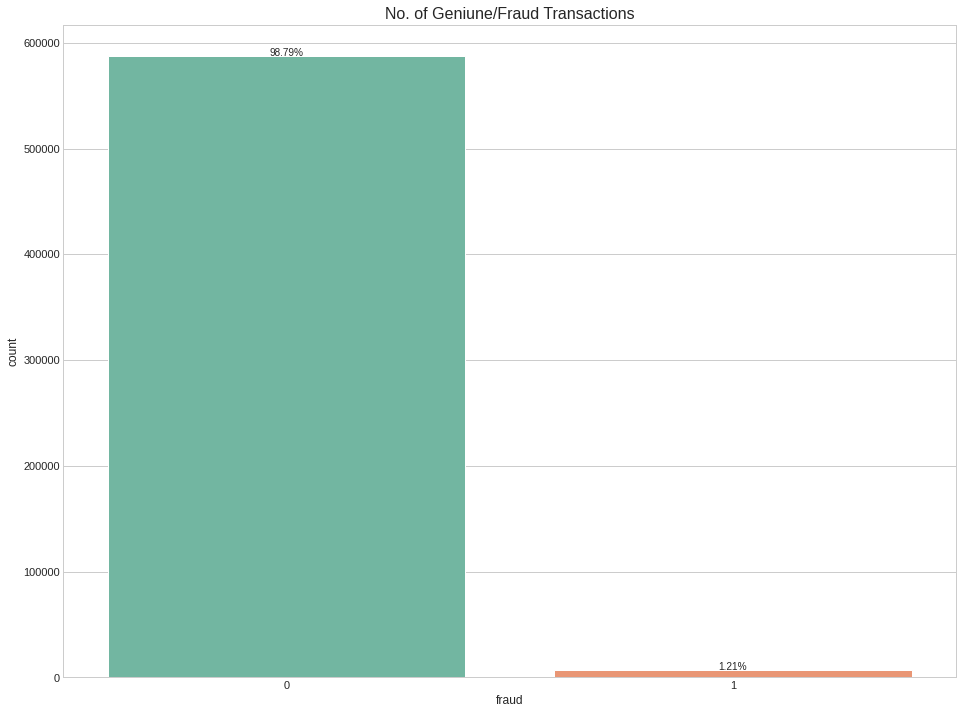

In [ ]:
countplot_helper(df, 'fraud', title = 'No. of Geniune/Fraud Transactions')

In [ ]:
df['fraud'].value_counts()

0    587443
1      7200
Name: fraud, dtype: int64

##Feature - Age Distribution

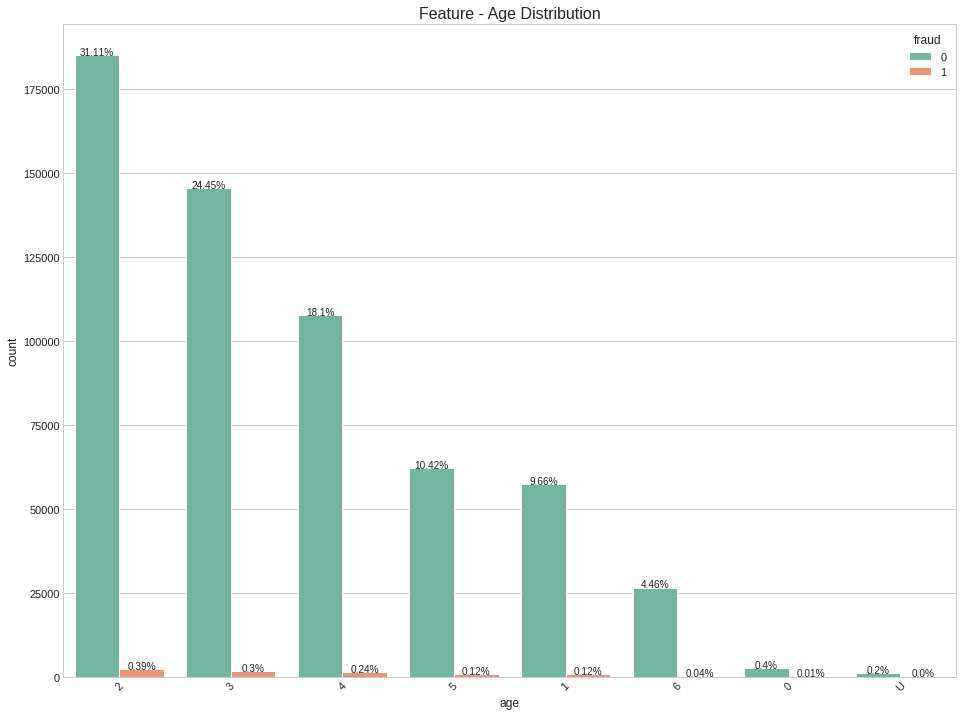

In [ ]:
countplot_helper(df, 'age', title = 'Feature - Age Distribution', hue = 'fraud')

* the three larges of the non-fradulent transactions have happened in '2', '3', and '4' category ages. 26-35 (31.11%), 36-45 (24.25%), and 46-55 (18.1%)
* the three larges of the fradulent transactions have happened in '2', '3', and '4' category ages. 26-35 (0.39%), 36-45 (0.3%), and 46-55 (0.24%)

In [ ]:
df.loc[df.fraud == 1,'age'].value_counts()

2    2344
3    1755
4    1410
1     689
5     686
6     261
0      48
U       7
Name: age, dtype: int64

It looks like fraud occurs more in ages 26-55(2-4th category). Can it be because many customers in their ages.

In [ ]:
def plot_count(df, feature, title='', size=2):
    f, ax = plt.subplots(1,1, figsize=(3*size,2*size))
    total = float(len(df))
    sns.countplot(df[feature],order = df[feature].value_counts().index, palette='Set3')
    plt.title(title)
    if(size > 2):
        plt.xticks(rotation=90, size=8)
    for p in ax.patches:
        height = p.get_height()
        ax.text(p.get_x()+p.get_width()/2.,
                height + 3,
                '{:1.2f}%'.format(100*height/total),
                ha="center") 
    plt.show()

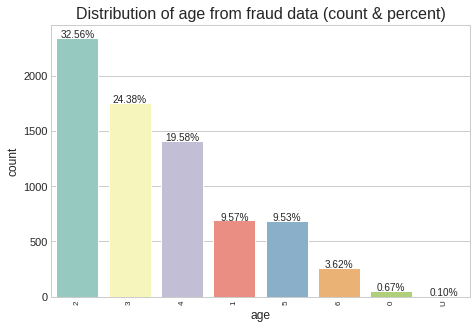

In [ ]:
plot_count(df_fraud, 'age', 'Distribution of age from fraud data (count & percent)', size=2.5)

##Feature - Gender Distribution

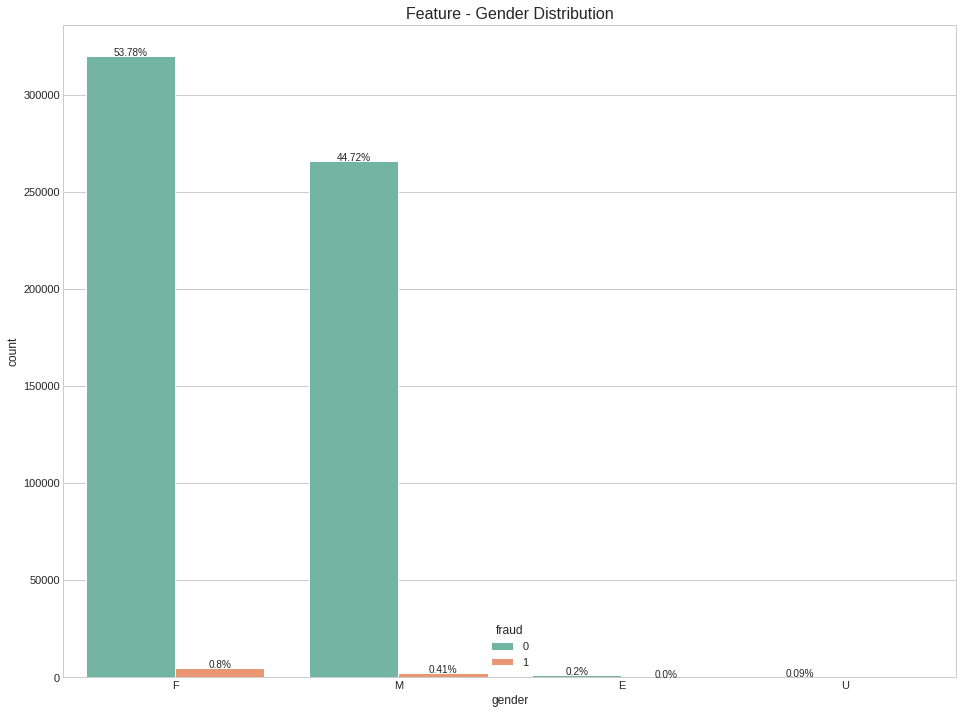

In [ ]:
countplot_helper(df, 'gender', title = 'Feature - Gender Distribution', hue = 'fraud')

* the two larges of the non-fradulent transactions have happened in 'F' and 'M' category gender. Female (53.78%) and Male (44.72%)
* the two larges of the fradulent transactions have happened in 'F' and 'M' category gender. Female (0.8%) and Male (0.41%)

In [ ]:
df.loc[df.fraud == 1,'gender'].value_counts()

F    4758
M    2435
E       7
Name: gender, dtype: int64

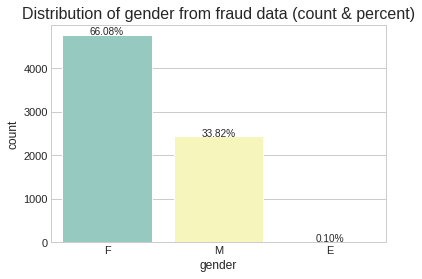

In [ ]:
plot_count(df_fraud, 'gender', 'Distribution of gender from fraud data (count & percent)')

It looks like fraud occurs more in female gender. because many customers in its gender.

##Feature - Category Distribution

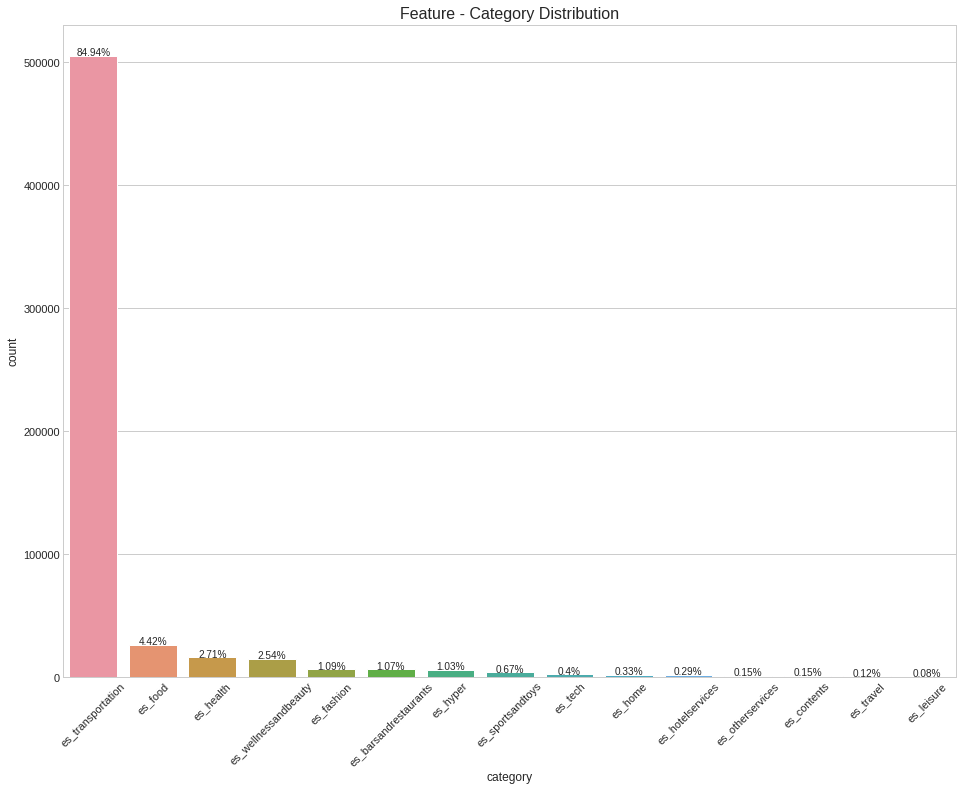

In [ ]:
countplot_helper(df, 'category', title = 'Feature - Category Distribution')

* Most of the transactions has happened in 'es_transportation' category
* It would be interesting to find out in which category the fradulent transactions happens

In [ ]:
# Create two dataframes with fraud and non-fraud data 
pd.concat([df_fraud.groupby('category')['amount'].mean(),df_non_fraud.groupby('category')['amount'].mean(),\
           df.groupby('category')['fraud'].mean()*100],keys=["Fraudulent","Non-Fraudulent","Percent(%)"],axis=1,\
          sort=False).sort_values(by=['Non-Fraudulent'])

,Fraudulent,Non-Fraudulent,Percent(%)
category,,,
es_transportation,NaN,26.958187,0.000000
es_food,NaN,37.070405,0.000000
es_hyper,169.255429,40.037145,4.591669
es_barsandrestaurants,164.092667,41.145997,1.882944
es_contents,NaN,44.547571,0.000000
es_wellnessandbeauty,229.422535,57.320219,4.759380
es_fashion,247.008190,62.347674,1.797335
es_leisure,300.286878,73.230400,94.989980
es_otherservices,316.469605,75.685497,25.000000


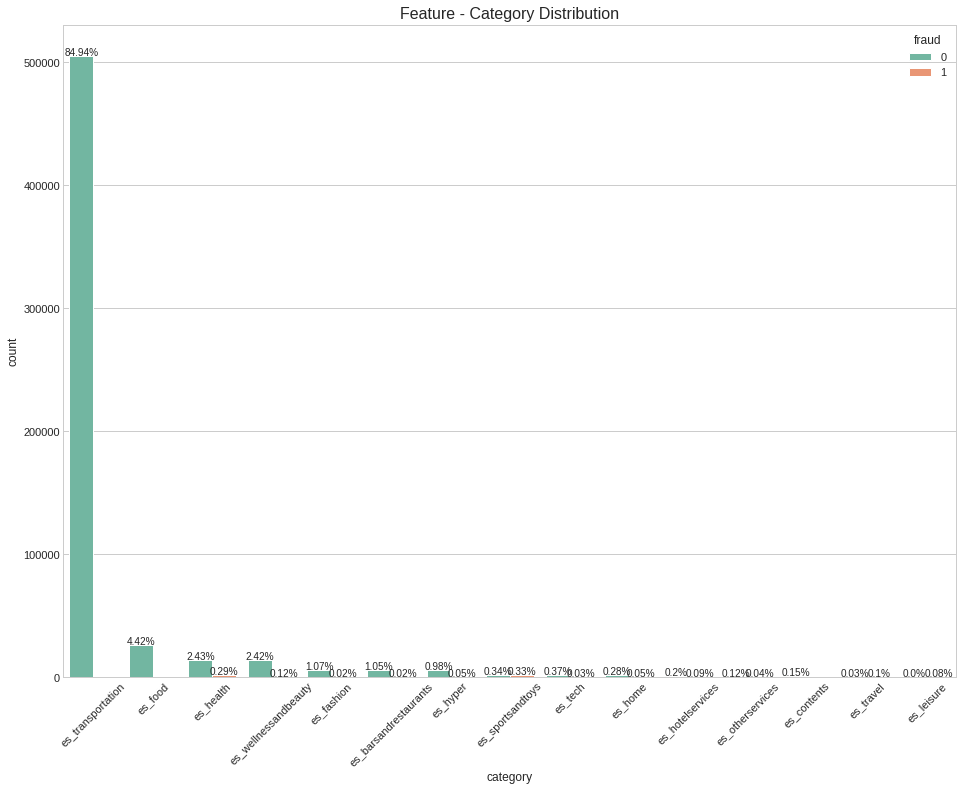

In [ ]:
countplot_helper(df, 'category', title = 'Feature - Category Distribution', hue = 'fraud')

* There is no Fraud transaction in 'es_transportation', 'es_food', and 'es_contents'
* Let's remove the es_transportation category and check the distribution

In [ ]:
fraud_cats = list(df[df['fraud'] == 1]['category'].unique())
print("The categories where fraud has been detected:")
print(*fraud_cats, sep = '\n')

The categories where fraud has been detected:
es_health
es_hotelservices
es_wellnessandbeauty
es_sportsandtoys
es_home
es_otherservices
es_fashion
es_leisure
es_travel
es_barsandrestaurants
es_tech
es_hyper


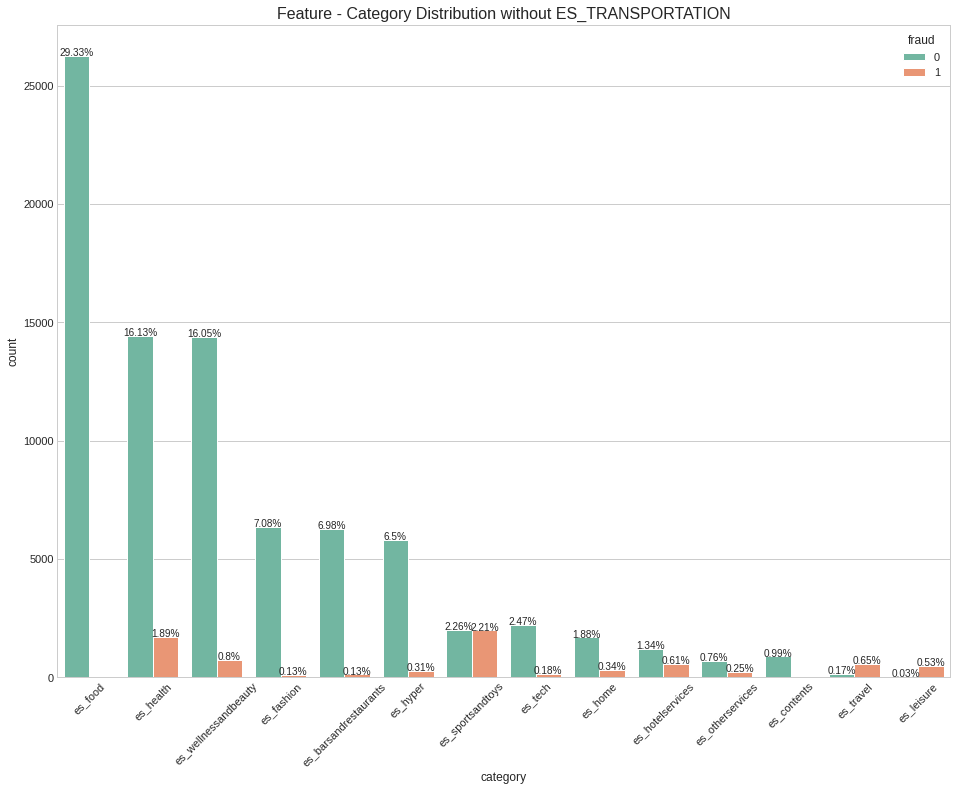

In [ ]:
temp = df[df['category'] != 'es_transportation']
countplot_helper(temp, 'category', title = 'Feature - Category Distribution without ES_TRANSPORTATION', hue = 'fraud')

In [ ]:
df.loc[df.fraud == 1,'category'].value_counts()

es_sportsandtoys         1982
es_health                1696
es_wellnessandbeauty      718
es_travel                 578
es_hotelservices          548
es_leisure                474
es_home                   302
es_hyper                  280
es_otherservices          228
es_tech                   158
es_barsandrestaurants     120
es_fashion                116
Name: category, dtype: int64

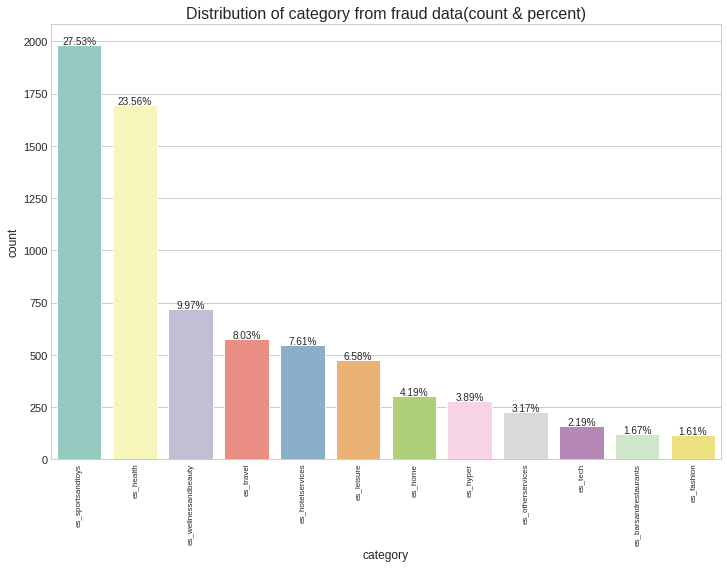

In [ ]:
plot_count(df_fraud, 'category', 'Distribution of category from fraud data(count & percent)', size=4)

It looks like fraud occurs more in sportsandtoys. Can it be because the category have less security in their system

##Boxplot and Log Distribution of Amount

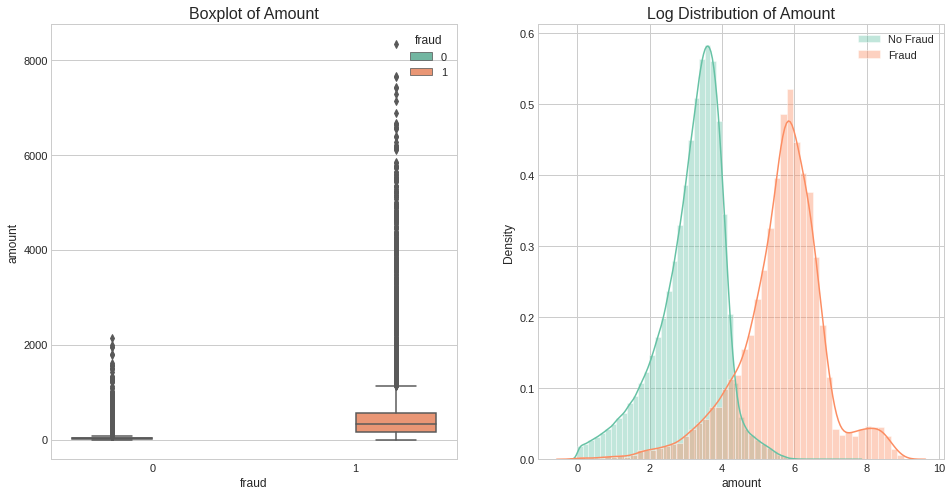

In [ ]:
fig, (ax1, ax2) = plt.subplots(ncols = 2, figsize = (16, 8))
ax1.set_title('Boxplot of Amount')
sns.boxplot(data = df, x = 'fraud', y = 'amount', hue = 'fraud', ax = ax1)

ax2.set_title('Log Distribution of Amount')
sns.distplot(np.log1p(df[df['fraud'] == 0]['amount']), label = 'No Fraud', ax = ax2)
sns.distplot(np.log1p(df[df['fraud'] == 1]['amount']), label = 'Fraud', ax = ax2)
ax2.legend()
plt.show()

* there is outlier on fraud data
* the amount of transaction is higher in fraud even though non-fraud transaction frequently is higher than fraud

##The average amount of transaction

In [ ]:
print('Fraud Transaction:')
print(f"Max. Transaction Amount: {df[df['fraud'] == 1]['amount'].max()}")
print(f"Min. Transaction Amount: {df[df['fraud'] == 1]['amount'].min()}")
print(f"Avg. Transaction Amount: {df[df['fraud'] == 1]['amount'].mean()}")
print(f"Median Transaction Amount: {df[df['fraud'] == 1]['amount'].median()}")
print('\nNo Fraud Transaction:')
print(f"Max. Transaction Amount: {df[df['fraud'] == 0]['amount'].max()}")
print(f"Min. Transaction Amount: {df[df['fraud'] == 0]['amount'].min()}")
print(f"Avg. Transaction Amount: {df[df['fraud'] == 0]['amount'].mean()}")
print(f"Median Transaction Amount: {df[df['fraud'] == 9]['amount'].median()}")

Fraud Transaction:
Max. Transaction Amount: 8329.96
Min. Transaction Amount: 0.03
Avg. Transaction Amount: 530.9265513888889
Median Transaction Amount: 319.175

No Fraud Transaction:
Max. Transaction Amount: 2144.86
Min. Transaction Amount: 0.0
Avg. Transaction Amount: 31.847230386607713
Median Transaction Amount: nan


The average amount of transaction is higher in Fraud compared to No Fraud

##Density Distribution plot of Step

In [ ]:
def bivariate_plots(df, x, y):
    fig, ax = plt.subplots()
    plt.scatter(df[x], df[y], c = 'blue', edgecolors = 'none', alpha = 0.5)
    plt.xlabel(x)
    plt.ylabel(y)
    plt.title(f'{x} vs. {y}')
    plt.show()

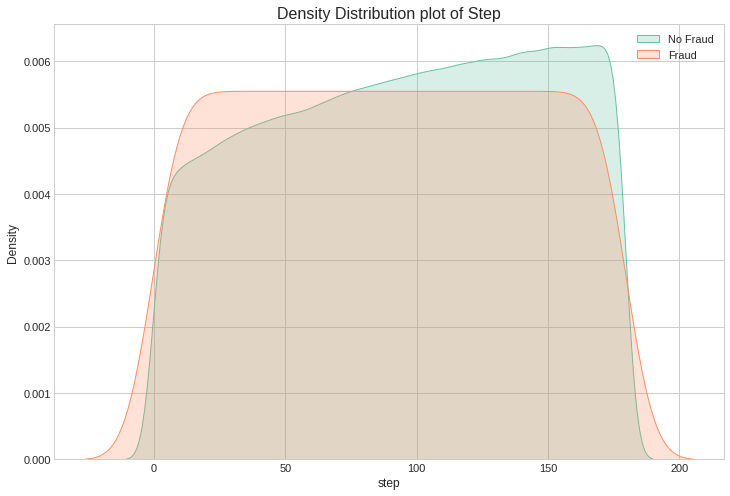

In [ ]:
plt.title('Density Distribution plot of Step')
sns.kdeplot(df[df['fraud'] == 0]['step'], shade = True, label = 'No Fraud')
sns.kdeplot(df[df['fraud'] == 1]['step'], shade = True, label = 'Fraud')
plt.legend()
plt.show()

##Step Vs Avg. Transaction Amount

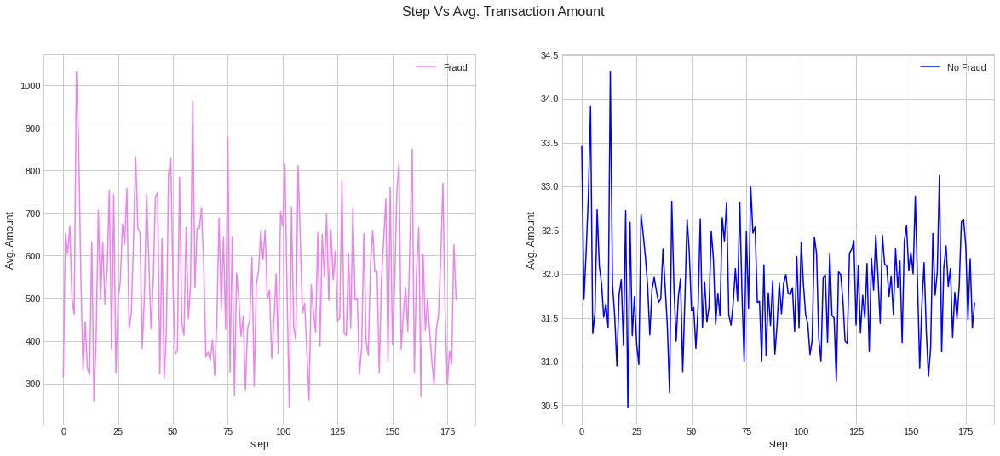

In [ ]:
fig, (ax1, ax2) = plt.subplots(ncols = 2, figsize = (20, 8))
df_fraud.groupby('step')['amount'].mean().plot(kind = 'line', label = 'Fraud', color = 'violet', legend = True, ax = ax1)
ax1.set_ylabel('Avg. Amount')
df_non_fraud.groupby('step')['amount'].mean().plot(kind = 'line', label = 'No Fraud', color = 'blue', legend = True, ax = ax2)
ax2.set_ylabel('Avg. Amount')
plt.suptitle('Step Vs Avg. Transaction Amount', fontsize = 16)
plt.show()

* The average amount spent during every 'step' is higher for fradulent transactions than normal ones
* Lets check how gender and age influences the transactions

####Step Vs Avg. Transaction Amount by Gender

In [ ]:
def subplots_helper(df: pd.DataFrame, col: str):
    colors = plt.rcParams['axes.prop_cycle']()
    for i, gender in enumerate(df[col].unique()):
        fig, (ax1, ax2) = plt.subplots(ncols = 2, nrows = 1, figsize = (20, 8))
        c = next(colors)['color']
        df_fraud[df_fraud[col] == gender].groupby('step')['amount'].mean().plot(kind = 'line', label = 'Fraud', color = c, legend = True, ax = ax1)
        ax1.set_ylabel('Avg. Amount')
        c = next(colors)['color']
        df_non_fraud[df_non_fraud[col] == gender].groupby('step')['amount'].mean().plot(kind = 'line', label = 'No Fraud', color = c, legend = True, ax = ax2)
        ax2.set_ylabel('Avg. Amount')
        plt.suptitle(f'Step Vs Avg. Transaction Amount for {col}: {gender}', y = 0.95, fontsize = 16)
        plt.figtext(0.5, 0.01, f"Figure {i + 1}", ha = 'center', fontsize = 16, bbox = {"facecolor": "grey", "alpha": 0.5, "pad": 5})
        plt.show()
    return None

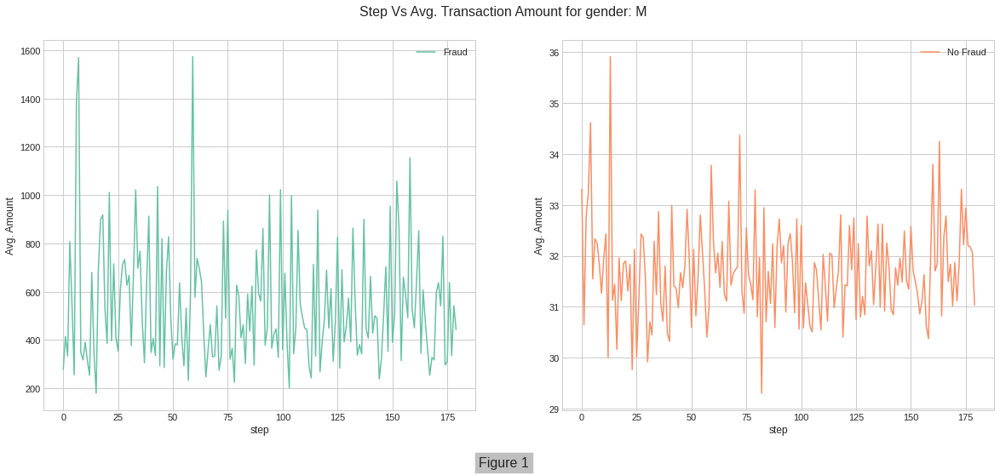

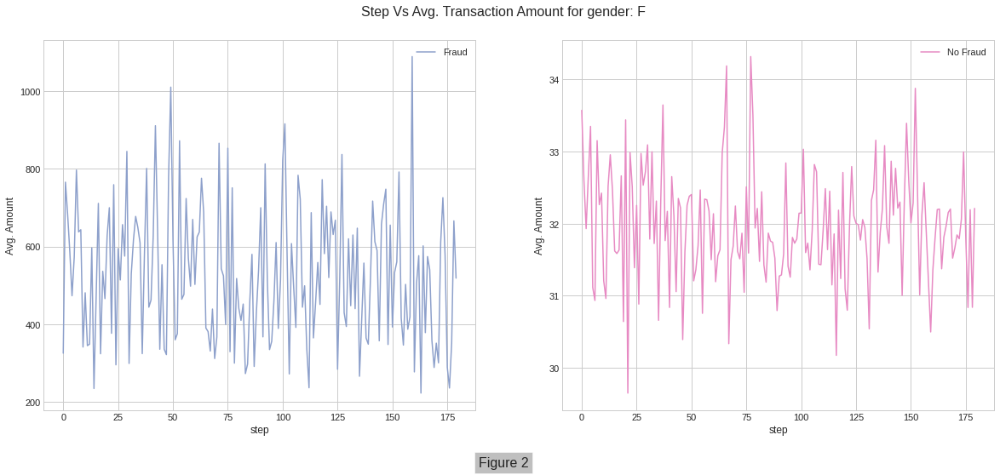

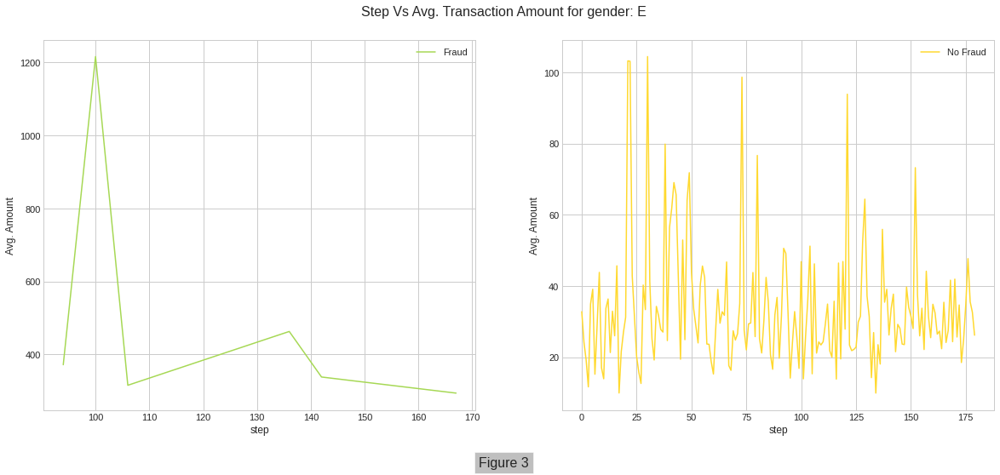

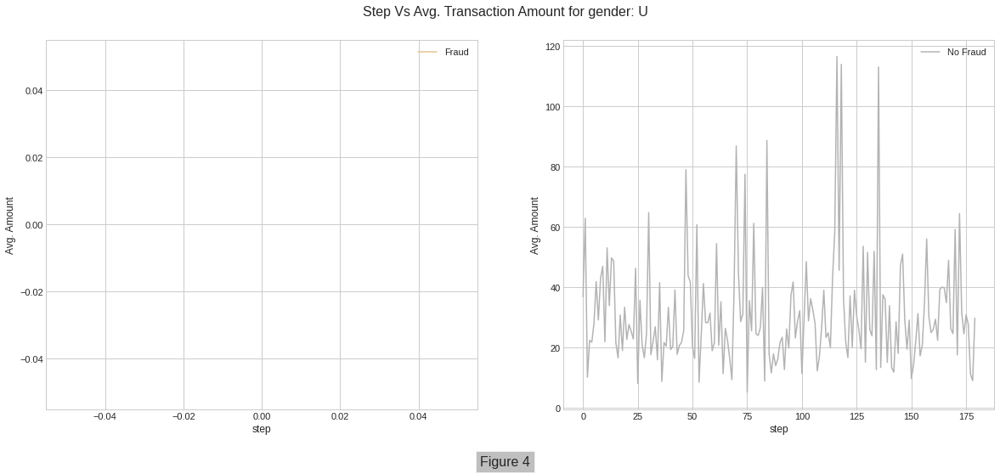

In [ ]:
subplots_helper(df, 'gender')

####Step Vs Avg. Transaction Amount by Ages

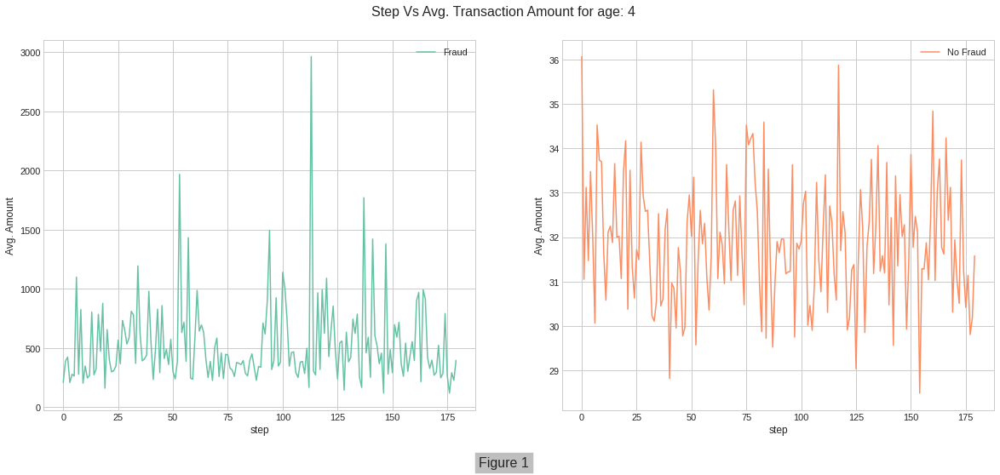

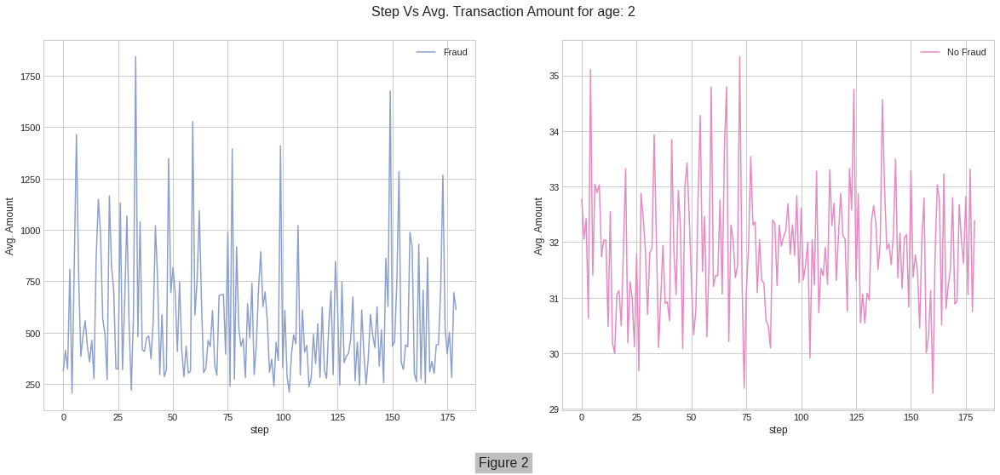

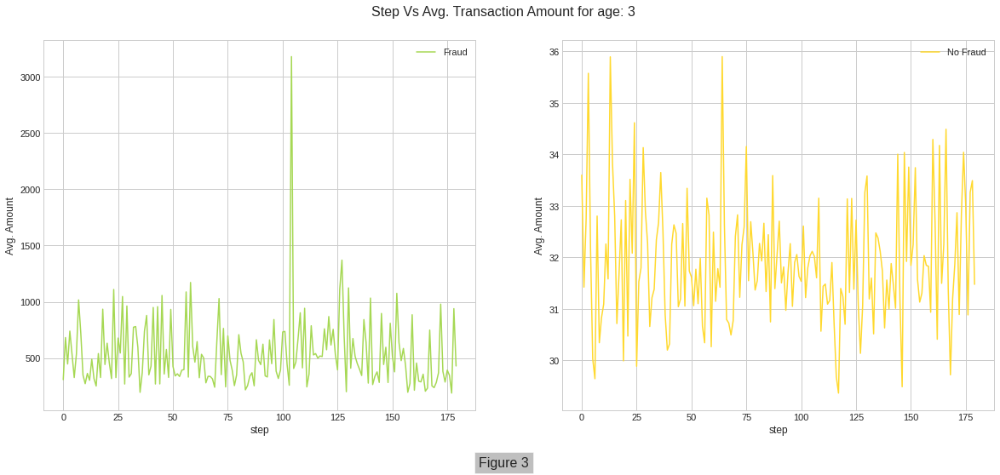

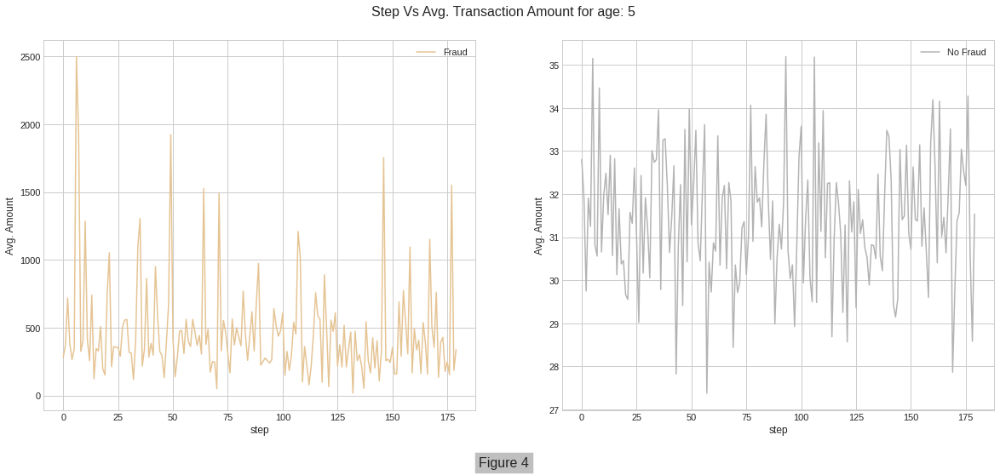

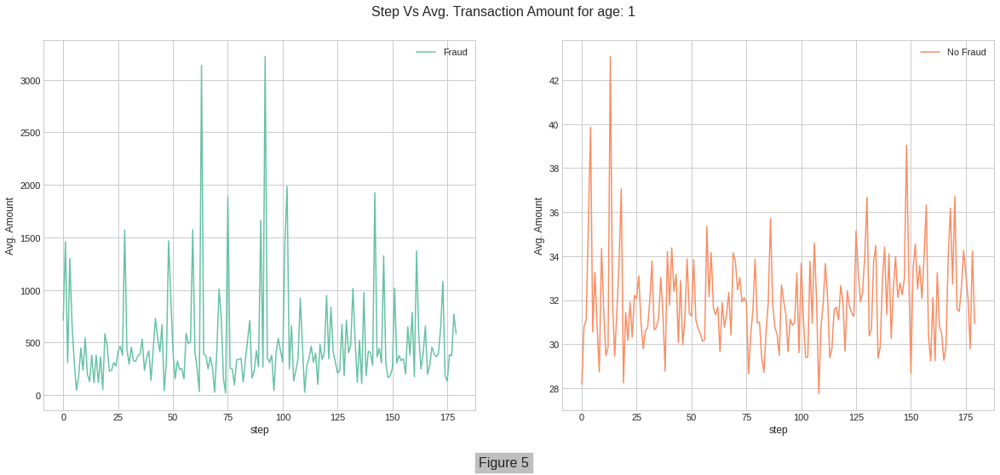

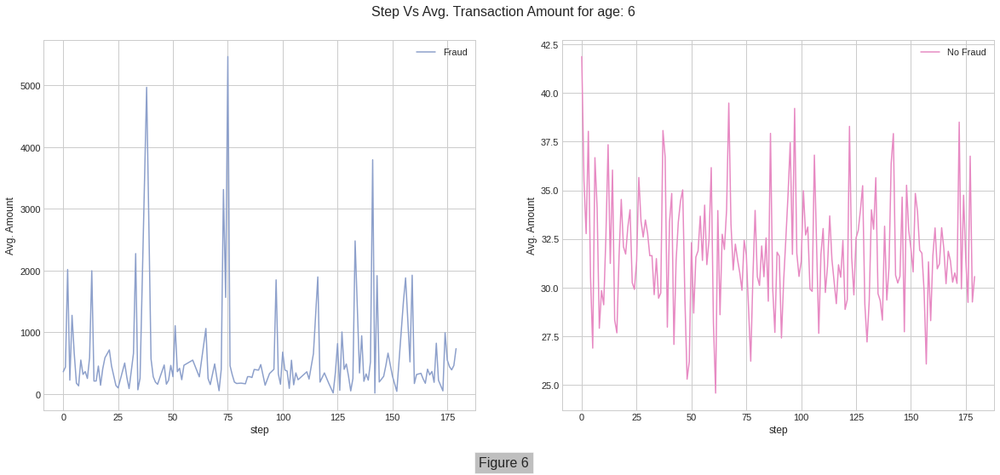

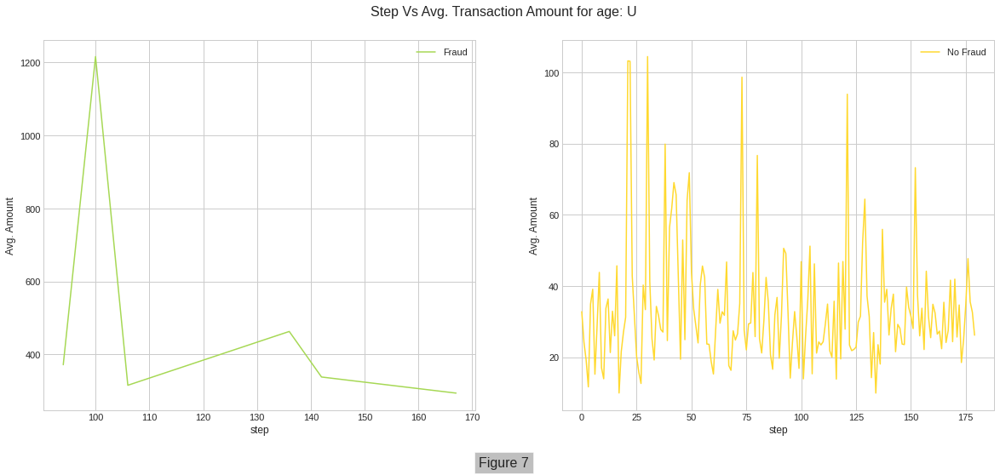

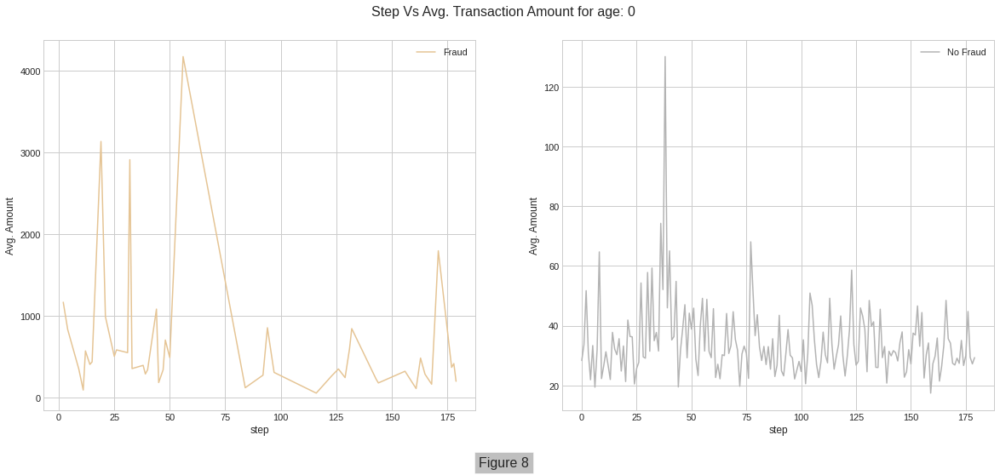

In [ ]:
subplots_helper(df, 'age')

* From above plots its clear that across figures/features, the amount transacted is higher in Fraudulent cases
* The bank could take special interest in high value transactions and do a check before its approved (most banks do this now)

##Feature - Merchant Distribution

In [ ]:
def cols_to_dict(col: str, kind: str = None):
    temp_dict = {}
    for val in df_fraud[col].unique():
        temp_dict[val] = len(df_non_fraud[df_non_fraud[col] == val])
    temp = pd.Series(temp_dict).to_frame(col)
    temp.iplot(kind = 'line' if kind else 'bar', 
              xTitle = col.title(), 
              yTitle = 'No. of Transactions', 
              title = f'No. of Normal Transactions done by {col.title()} in Fraudulent Transaction')
    return None

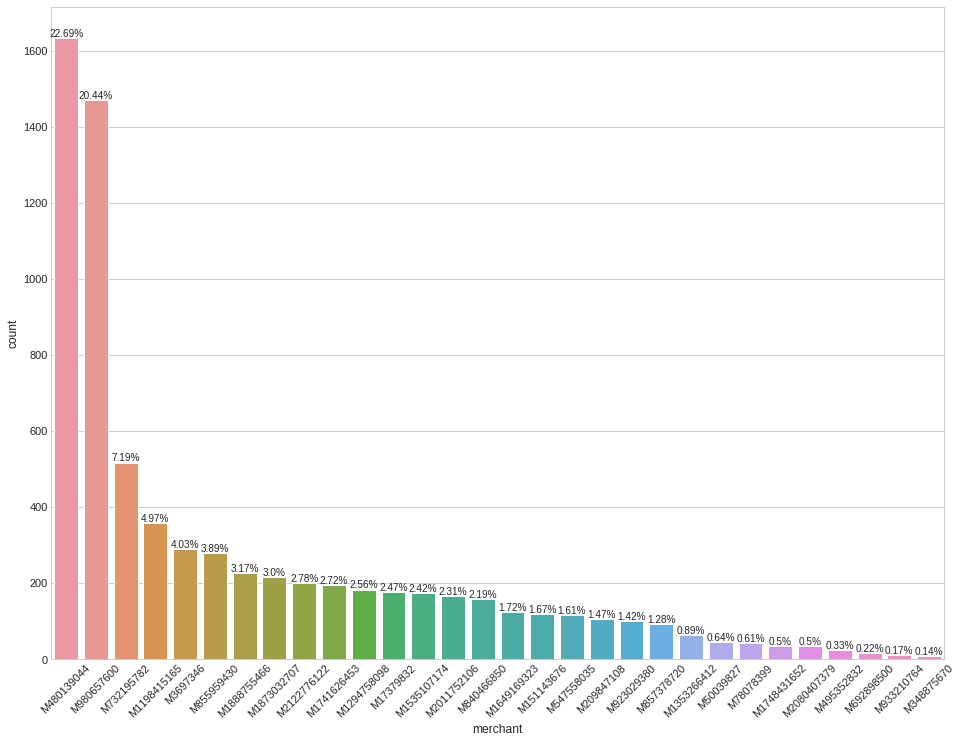

In [ ]:
countplot_helper(df_fraud, col = 'merchant')

* Of the total fradulent transaction, 43% happens with merchants M480139044 and M980657600

* What category of items that customers buy with these merchants and how much amount transacted?

Our hypothesis for fraudsters choosing the categories which people spend more is only partly correct, but as we can see in the table below we can say confidently say that a fraudulent transaction will be much more (about four times or more) than average for that category.

###The Three Top Fraud category by amount

In [ ]:
temp = df_fraud[df_fraud['merchant'] == 'M732195782'][['category', 'amount']]
print(f"Top Fraud category: {temp['category'].unique()}, Total amount transacted: {temp['amount'].sum()}")
temp = df_fraud[df_fraud['merchant'] == 'M480139044'][['category', 'amount']]
print(f"Top Fraud category: {temp['category'].unique()}, Total amount transacted: {temp['amount'].sum()}")
temp = df_fraud[df_fraud['merchant'] == 'M980657600'][['category', 'amount']]
print(f"Top Fraud category: {temp['category'].unique()}, Total amount transacted: {temp['amount'].sum()}")

Top Fraud category: ['es_travel'], Total amount transacted: 1350979.31
Top Fraud category: ['es_health'], Total amount transacted: 664804.3899999999
Top Fraud category: ['es_sportsandtoys'], Total amount transacted: 505311.62


Top fradulent transactions happen in es_travel, es_health and es_sportandtoys category with the biggest total amount transacted in a merchant are 1,350,979 ; 664,804 and 505,311 respectively.




###Top 10 merchant & category by amount

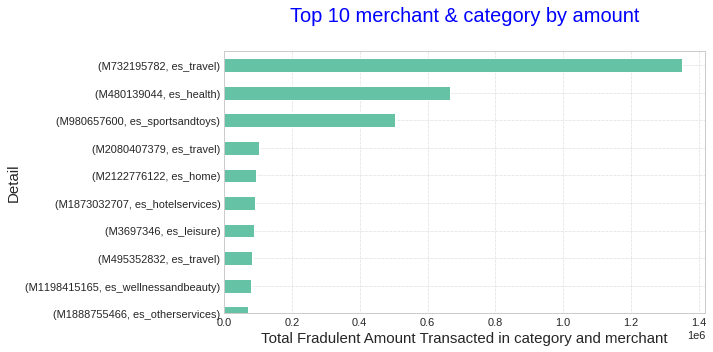

In [ ]:
df_fraud.groupby(['merchant','category'])['amount'].sum().sort_values(ascending = True).tail(10).plot(kind = 'barh')
plt.title('Top 10 merchant & category by amount', loc='center',pad=30, fontsize=20, color='blue')
plt.xlabel('Total Fradulent Amount Transacted in category and merchant', fontsize = 15)
plt.ylabel('Detail', fontsize = 15)
plt.grid(color='darkgray', linestyle=':',linewidth=0.5)
plt.ylim(ymin=0)
plt.gcf().set_size_inches(10,5)
plt.tight_layout()
plt.show()

es_travel, es_health, and es_sportsandtoys is 3 top fraudulent transactions happen

Which merchants were affected?

###Total Fraudulent Amount Transacted in Category by Merchants

####Es_travel

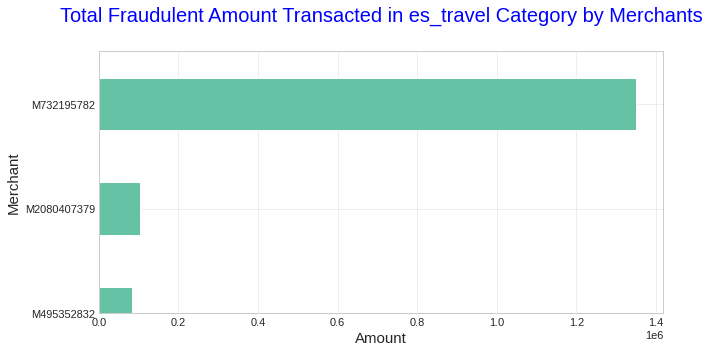

In [ ]:
df_fraud[df_fraud['category'] == 'es_travel'][['merchant', 'amount']].groupby('merchant')['amount'].sum().sort_values(ascending = True).tail(10).plot(kind = 'barh')
plt.title('Total Fraudulent Amount Transacted in es_travel Category by Merchants', loc='center',pad=30, fontsize=20, color='blue')
plt.xlabel('Amount', fontsize = 15)
plt.ylabel('Merchant', fontsize = 15)
plt.grid(color='darkgray', linestyle=':',linewidth=0.5)
plt.ylim(ymin=0)
plt.gcf().set_size_inches(10,5)
plt.tight_layout()
plt.show()

In [ ]:
df_fraud.loc[df.category == 'es_travel','merchant'].value_counts()

M732195782     518
M2080407379     36
M495352832      24
Name: merchant, dtype: int64

in es_travel category, the merchant has the fraudulent amount is M732195782 with Total amount transacted: 1,350,979.31 and count of transaction is 518.

####Es_health

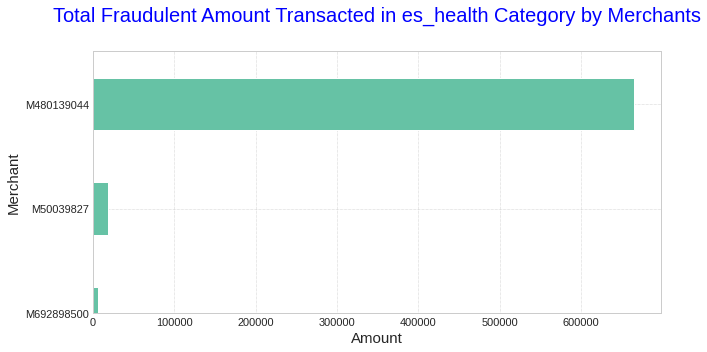

In [ ]:
df_fraud[df_fraud['category'] == 'es_health'][['merchant', 'amount']].groupby('merchant')['amount'].sum().sort_values(ascending = True).tail(10).plot(kind = 'barh')
plt.title('Total Fraudulent Amount Transacted in es_health Category by Merchants', loc='center',pad=30, fontsize=20, color='blue')
plt.xlabel('Amount', fontsize = 15)
plt.ylabel('Merchant', fontsize = 15)
plt.grid(color='darkgray', linestyle=':',linewidth=0.5)
plt.ylim(ymin=0)
plt.gcf().set_size_inches(10,5)
plt.tight_layout()
plt.show()

In [ ]:
df_fraud.loc[df.category == 'es_health','merchant'].value_counts()

M480139044    1634
M50039827       46
M692898500      16
Name: merchant, dtype: int64

in es_health category, the merchant has the fraudulent amount is M480139044 with Total amount transacted: 664,804.3899999999 and count of transaction is 1634.

####Es_sportsandtoys

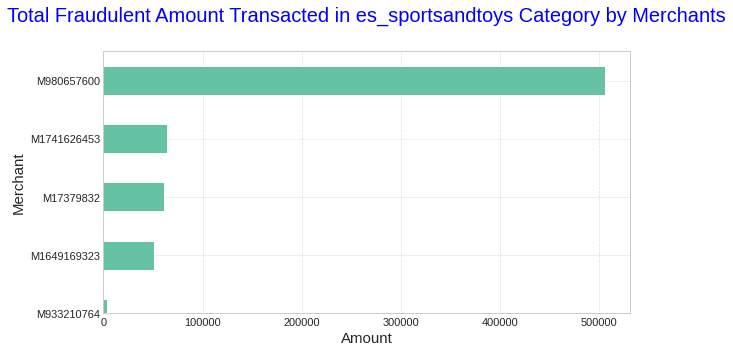

In [ ]:
df_fraud[df_fraud['category'] == 'es_sportsandtoys'][['merchant', 'amount']].groupby('merchant')['amount'].sum().sort_values(ascending = True).tail(10).plot(kind = 'barh')
plt.title('Total Fraudulent Amount Transacted in es_sportsandtoys Category by Merchants', loc='center',pad=30, fontsize=20, color='blue')
plt.xlabel('Amount', fontsize = 15)
plt.ylabel('Merchant', fontsize = 15)
plt.grid(color='darkgray', linestyle=':',linewidth=0.5)
plt.ylim(ymin=0)
plt.gcf().set_size_inches(10,5)
plt.tight_layout()
plt.show()

In [ ]:
df_fraud.loc[df.category == 'es_sportsandtoys','merchant'].value_counts()

M980657600     1472
M1741626453     196
M17379832       178
M1649169323     124
M933210764       12
Name: merchant, dtype: int64

in es_sportsandtoys category, the merchant has the fraudulent amount is M980657600 with Total amount transacted: 505,311.62 and count of transaction is 1472.

####Es_wellnessandbeauty

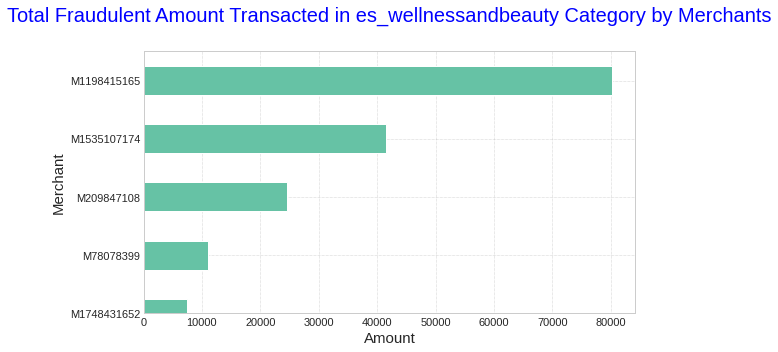

In [ ]:
df_fraud[df_fraud['category'] == 'es_wellnessandbeauty'][['merchant', 'amount']].groupby('merchant')['amount'].sum().sort_values(ascending = True).tail(10).plot(kind = 'barh')
plt.title('Total Fraudulent Amount Transacted in es_wellnessandbeauty Category by Merchants', loc='center',pad=30, fontsize=20, color='blue')
plt.xlabel('Amount', fontsize = 15)
plt.ylabel('Merchant', fontsize = 15)
plt.grid(color='darkgray', linestyle=':',linewidth=0.5)
plt.ylim(ymin=0)
plt.gcf().set_size_inches(10,5)
plt.tight_layout()
plt.show()

In [ ]:
df_fraud.loc[df.category == 'es_wellnessandbeauty','merchant'].value_counts()

M1198415165    358
M1535107174    174
M209847108     106
M78078399       44
M1748431652     36
Name: merchant, dtype: int64

in es_wellnessandbeauty category, the merchant has the fraudulent amount is M1198415165 with Total amount transacted: 80,191.82999999999 and count of transaction is 358.

####Es_hotelservices

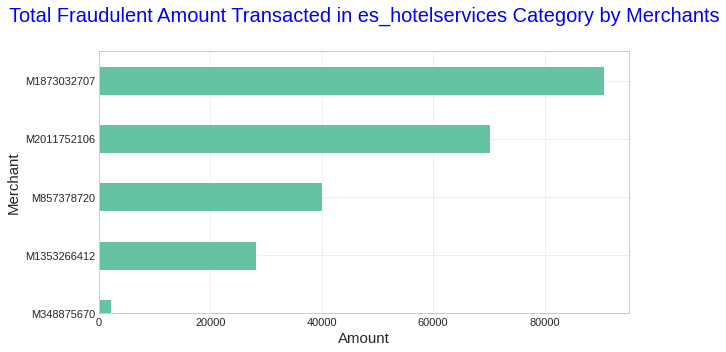

In [ ]:
df_fraud[df_fraud['category'] == 'es_hotelservices'][['merchant', 'amount']].groupby('merchant')['amount'].sum().sort_values(ascending = True).tail(10).plot(kind = 'barh')
plt.title('Total Fraudulent Amount Transacted in es_hotelservices Category by Merchants', loc='center',pad=30, fontsize=20, color='blue')
plt.xlabel('Amount', fontsize = 15)
plt.ylabel('Merchant', fontsize = 15)
plt.grid(color='darkgray', linestyle=':',linewidth=0.5)
plt.ylim(ymin=0)
plt.gcf().set_size_inches(10,5)
plt.tight_layout()
plt.show()

In [ ]:
df_fraud.loc[df.category == 'es_hotelservices','merchant'].value_counts()

M1873032707    216
M2011752106    166
M857378720      92
M1353266412     64
M348875670      10
Name: merchant, dtype: int64

in es_hotelservices category, the merchant has the fraudulent amount is M1873032707 with Total amount transacted: 90,653.68 and count of transaction is 216.

####Es_leisure

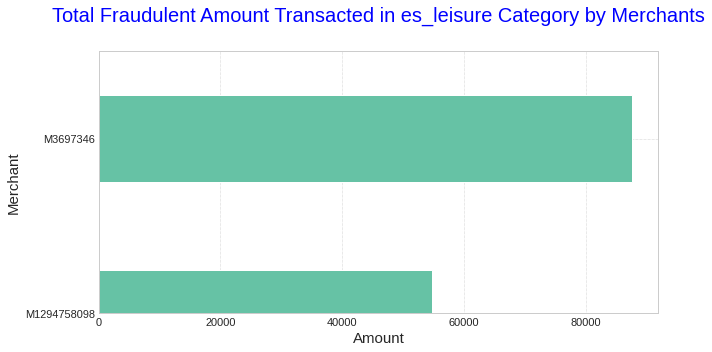

In [ ]:
df_fraud[df_fraud['category'] == 'es_leisure'][['merchant', 'amount']].groupby('merchant')['amount'].sum().sort_values(ascending = True).tail(10).plot(kind = 'barh')
plt.title('Total Fraudulent Amount Transacted in es_leisure Category by Merchants', loc='center',pad=30, fontsize=20, color='blue')
plt.xlabel('Amount', fontsize = 15)
plt.ylabel('Merchant', fontsize = 15)
plt.grid(color='darkgray', linestyle=':',linewidth=0.5)
plt.ylim(ymin=0)
plt.gcf().set_size_inches(10,5)
plt.tight_layout()
plt.show()

In [ ]:
df_fraud.loc[df.category == 'es_leisure','merchant'].value_counts()

M3697346       290
M1294758098    184
Name: merchant, dtype: int64

in es_leisure category, the merchant has the fraudulent amount is M3697346 with Total amount transacted: 87,527.64 and count of transaction is 290.

####Es_home

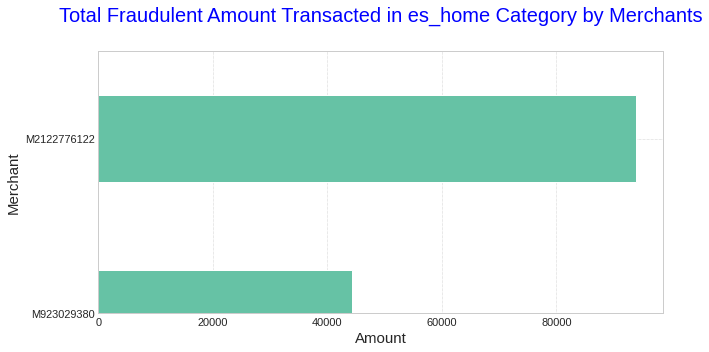

In [ ]:
df_fraud[df_fraud['category'] == 'es_home'][['merchant', 'amount']].groupby('merchant')['amount'].sum().sort_values(ascending = True).tail(10).plot(kind = 'barh')
plt.title('Total Fraudulent Amount Transacted in es_home Category by Merchants', loc='center',pad=30, fontsize=20, color='blue')
plt.xlabel('Amount', fontsize = 15)
plt.ylabel('Merchant', fontsize = 15)
plt.grid(color='darkgray', linestyle=':',linewidth=0.5)
plt.ylim(ymin=0)
plt.gcf().set_size_inches(10,5)
plt.tight_layout()
plt.show()

In [ ]:
df_fraud.loc[df.category == 'es_home','merchant'].value_counts()

M2122776122    200
M923029380     102
Name: merchant, dtype: int64

in es_home category, the merchant has the fraudulent amount is M2122776122 with Total amount transacted: 93,889.68 and count of transaction is 200.

####Es_hyper

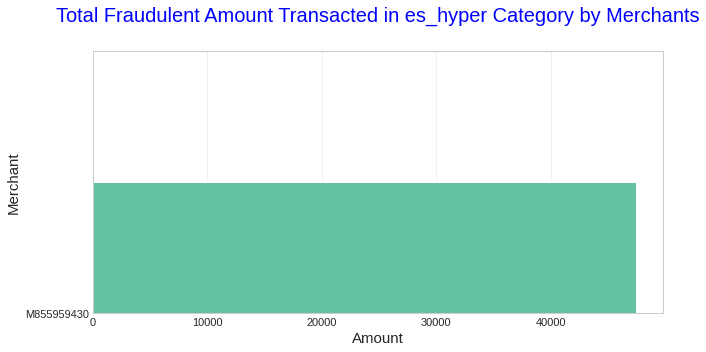

In [ ]:
df_fraud[df_fraud['category'] == 'es_hyper'][['merchant', 'amount']].groupby('merchant')['amount'].sum().sort_values(ascending = True).tail(10).plot(kind = 'barh')
plt.title('Total Fraudulent Amount Transacted in es_hyper Category by Merchants', loc='center',pad=30, fontsize=20, color='blue')
plt.xlabel('Amount', fontsize = 15)
plt.ylabel('Merchant', fontsize = 15)
plt.grid(color='darkgray', linestyle=':',linewidth=0.5)
plt.ylim(ymin=0)
plt.gcf().set_size_inches(10,5)
plt.tight_layout()
plt.show()

In [ ]:
df_fraud.loc[df.category == 'es_hyper','merchant'].value_counts()

M855959430    280
Name: merchant, dtype: int64

in es_hyper category, the merchant has the fraudulent amount is M855959430 with Total amount transacted: 47,391.520000000004 and count of transaction is 280.

####Es_otherservices

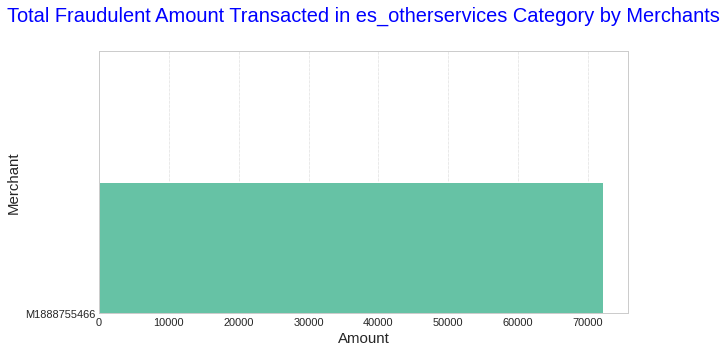

In [ ]:
df_fraud[df_fraud['category'] == 'es_otherservices'][['merchant', 'amount']].groupby('merchant')['amount'].sum().sort_values(ascending = True).tail(10).plot(kind = 'barh')
plt.title('Total Fraudulent Amount Transacted in es_otherservices Category by Merchants', loc='center',pad=30, fontsize=20, color='blue')
plt.xlabel('Amount', fontsize = 15)
plt.ylabel('Merchant', fontsize = 15)
plt.grid(color='darkgray', linestyle=':',linewidth=0.5)
plt.ylim(ymin=0)
plt.gcf().set_size_inches(10,5)
plt.tight_layout()
plt.show()

In [ ]:
df_fraud.loc[df.category == 'es_otherservices','merchant'].value_counts()

M1888755466    228
Name: merchant, dtype: int64

in es_otherservices category, the merchant has the fraudulent amount is M1888755466 with Total amount transacted: 72,155.07 and count of transaction is 228.

####Es_tech

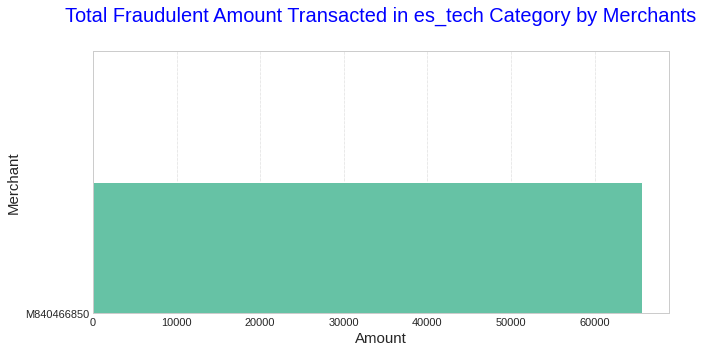

In [ ]:
df_fraud[df_fraud['category'] == 'es_tech'][['merchant', 'amount']].groupby('merchant')['amount'].sum().sort_values(ascending = True).tail(10).plot(kind = 'barh')
plt.title('Total Fraudulent Amount Transacted in es_tech Category by Merchants', loc='center',pad=30, fontsize=20, color='blue')
plt.xlabel('Amount', fontsize = 15)
plt.ylabel('Merchant', fontsize = 15)
plt.grid(color='darkgray', linestyle=':',linewidth=0.5)
plt.ylim(ymin=0)
plt.gcf().set_size_inches(10,5)
plt.tight_layout()
plt.show()

In [ ]:
df_fraud.loc[df.category == 'es_tech','merchant'].value_counts()

M840466850    158
Name: merchant, dtype: int64

in es_tech category, the merchant has the fraudulent amount is M840466850 with Total amount transacted: 65,613.30999999998 and count of transaction is 158.

####Es_barsandrestaurants

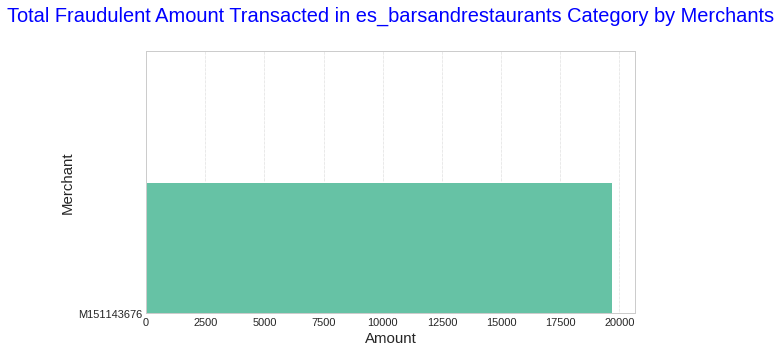

In [ ]:
df_fraud[df_fraud['category'] == 'es_barsandrestaurants'][['merchant', 'amount']].groupby('merchant')['amount'].sum().sort_values(ascending = True).tail(10).plot(kind = 'barh')
plt.title('Total Fraudulent Amount Transacted in es_barsandrestaurants Category by Merchants', loc='center',pad=30, fontsize=20, color='blue')
plt.xlabel('Amount', fontsize = 15)
plt.ylabel('Merchant', fontsize = 15)
plt.grid(color='darkgray', linestyle=':',linewidth=0.5)
plt.ylim(ymin=0)
plt.gcf().set_size_inches(10,5)
plt.tight_layout()
plt.show()

In [ ]:
df_fraud.loc[df.category == 'es_barsandrestaurants','merchant'].value_counts()

M151143676    120
Name: merchant, dtype: int64

in es_barsandrestaurants category, the merchant has the fraudulent amount is M151143676 with Total amount transacted: 19,691.120000000003 and count of transaction is 120.

####Es_fashion

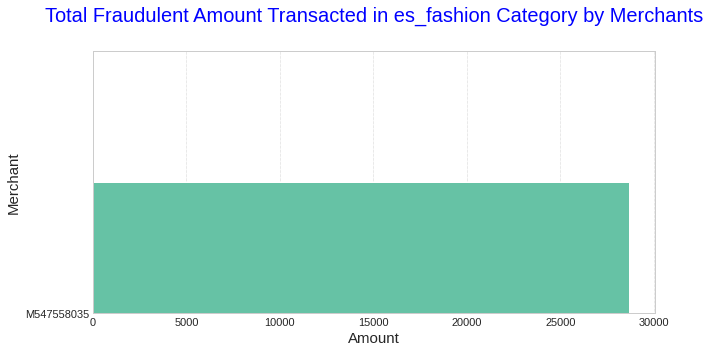

In [ ]:
df_fraud[df_fraud['category'] == 'es_fashion'][['merchant', 'amount']].groupby('merchant')['amount'].sum().sort_values(ascending = True).tail(10).plot(kind = 'barh')
plt.title('Total Fraudulent Amount Transacted in es_fashion Category by Merchants', loc='center',pad=30, fontsize=20, color='blue')
plt.xlabel('Amount', fontsize = 15)
plt.ylabel('Merchant', fontsize = 15)
plt.grid(color='darkgray', linestyle=':',linewidth=0.5)
plt.ylim(ymin=0)
plt.gcf().set_size_inches(10,5)
plt.tight_layout()
plt.show()

In [ ]:
df_fraud.loc[df.category == 'es_fashion','merchant'].value_counts()

M547558035    116
Name: merchant, dtype: int64

In [ ]:
temp = df_fraud[df_fraud['merchant'] == 'M547558035'][['category', 'amount']]
print(f"Top Fraud category: {temp['category'].unique()}, Total amount transacted: {temp['amount'].sum()}")

Top Fraud category: ['es_fashion'], Total amount transacted: 28652.95


in es_fashion category, the merchant has the fraudulent amount is M547558035 with Total amount transacted: 28,652.95 and count of transaction is 116.

* From the above plots we can get which merchants are affected by fraudulent transaction by looking at the total amount transacted, may be the bank should flag these merchants and monitor transactions closely
* We can do the same analysis for customer feature but flagging customers would be a bad idea

##Boxplot for the Amount spend in category

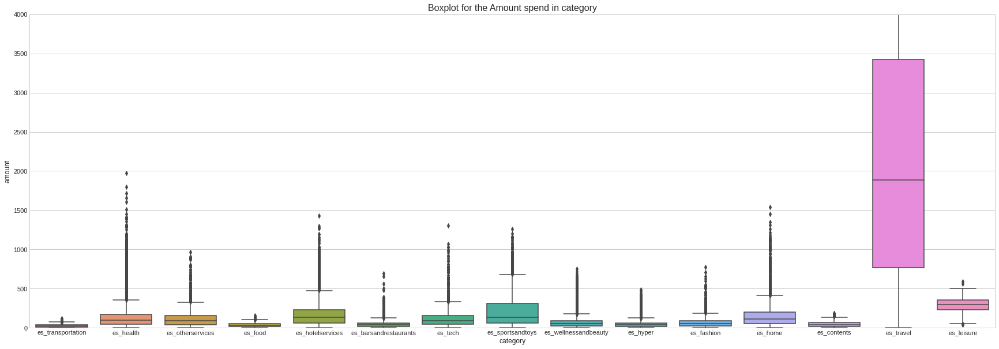

In [ ]:
# Plot histograms of the amounts in fraud and non-fraud data 
plt.figure(figsize=(30,10))
sns.boxplot(x=df.category,y=df.amount)
plt.title("Boxplot for the Amount spend in category")
plt.ylim(0,4000)
plt.legend()
plt.show()

Average amount spend it categories are similar; except for the travel category which goes very high. there are outliers in es_health, es_hotelservices, es_tech, and es_home.

##Plot Histogram

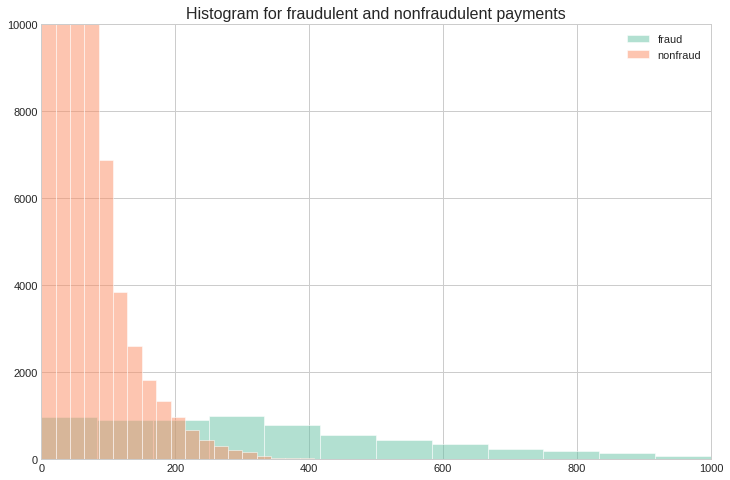

In [ ]:
# Plot histograms of the amounts in fraud and non-fraud data 
plt.hist(df_fraud.amount, alpha=0.5, label='fraud',bins=100)
plt.hist(df_non_fraud.amount, alpha=0.5, label='nonfraud',bins=100)
plt.title("Histogram for fraudulent and nonfraudulent payments")
plt.ylim(0,10000)
plt.xlim(0,1000)
plt.legend()
plt.show()

Again we can see in the histogram below the fradulent transactions are less in count but more in amount.

##Boxplot for the Amount spend in gender

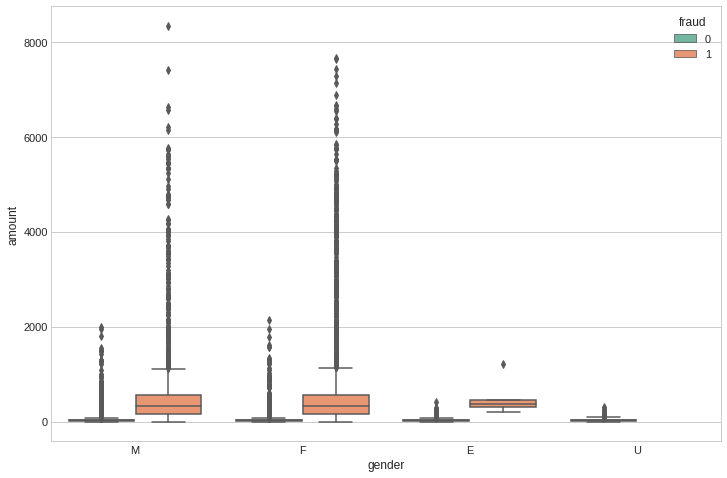

In [ ]:
ax = sns.boxplot(x="gender", y="amount", hue="fraud", data=df)

there are outliers in male and enterprise gender in fraudulent data

##Catplot for the Amount spend in gender

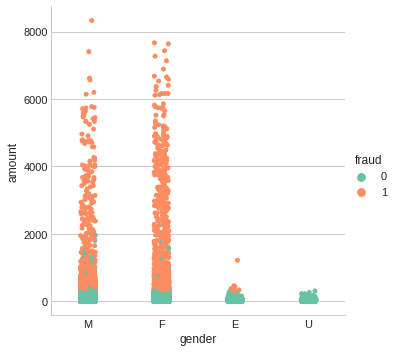

In [ ]:
sns.catplot(x="gender", y="amount", hue="fraud", data=df);

there are outliers in male and enterprise gender in fraudulent data

##Data Preprocessing

In [ ]:
df_reduced=df.copy()

In [ ]:
df_reduced.head()

,step,customer,age,gender,merchant,category,amount,fraud
0,0,C1093826151,4,M,M348934600,es_transportation,4.55,0
1,0,C352968107,2,M,M348934600,es_transportation,39.68,0
2,0,C2054744914,4,F,M1823072687,es_transportation,26.89,0
3,0,C1760612790,3,M,M348934600,es_transportation,17.25,0
4,0,C757503768,5,M,M348934600,es_transportation,35.72,0


In [ ]:
# turning object columns type to categorical for easing the transformation process
col_categorical = df_reduced.select_dtypes(include= ['object']).columns
for col in col_categorical:
    df_reduced[col] = df_reduced[col].astype('category')
# categorical values ==> numeric values
df_reduced[col_categorical] = df_reduced[col_categorical].apply(lambda x: x.cat.codes)
df_reduced.head(5)

,step,customer,age,gender,merchant,category,amount,fraud
0,0,210,4,2,30,12,4.55,0
1,0,2753,2,2,30,12,39.68,0
2,0,2285,4,1,18,12,26.89,0
3,0,1650,3,2,30,12,17.25,0
4,0,3585,5,2,30,12,35.72,0


In [ ]:
X = df_reduced.drop(['fraud'],axis=1)
y = df['fraud']
print(X.head(),"\n")
print(y.head())

   step  customer  age  gender  merchant  category  amount
0     0       210    4       2        30        12    4.55
1     0      2753    2       2        30        12   39.68
2     0      2285    4       1        18        12   26.89
3     0      1650    3       2        30        12   17.25
4     0      3585    5       2        30        12   35.72 

0    0
1    0
2    0
3    0
4    0
Name: fraud, dtype: int64


In [ ]:
y[y==1].count()

7200

###Implement resampling methods using Python imblean module

In [ ]:
from imblearn.over_sampling import RandomOverSampler

method = RandomOverSampler()
X_resampled, y_resampled =  method.fit_resample(X, y)

In [ ]:
from collections import Counter
print(Counter(y_resampled))

Counter({0: 587443, 1: 587443})


In [ ]:
# I won't do cross validation since we have a lot of instances
X_train, X_test, y_train, y_test = train_test_split(X_resampled,y_resampled,test_size=0.3,random_state=42,shuffle=True,stratify=y_resampled)

In [ ]:
# Continue fitting the model and obtain predictions
model = LogisticRegression()

In [ ]:
model.fit(X_resampled, y_resampled)

/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



LogisticRegression()

In [ ]:
# Get model performance metrics
predicted = model.predict(X_test)
print(classification_report(y_test, predicted))

              precision    recall  f1-score   support

           0       0.89      0.94      0.91    176233
           1       0.94      0.88      0.91    176233

    accuracy                           0.91    352466
   macro avg       0.91      0.91      0.91    352466
weighted avg       0.91      0.91      0.91    352466



In [ ]:
# %% Function for plotting ROC_AUC curve

def plot_roc_auc_score(y_test, preds):
    '''
    Takes actual and predicted(probabilities) as input and plots the Receiver
    Operating Characteristic (ROC) curve
    '''
    fpr, tpr, threshold = roc_curve(y_test, preds)
    roc_auc = auc(fpr, tpr)
    plt.title('Receiver Operating Characteristic')
    plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
    plt.legend(loc = 'lower right')
    plt.plot([0, 1], [0, 1],'r--')
    plt.xlim([0, 1])
    plt.ylim([0, 1])
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()

In [ ]:
# The base score should be better than predicting always non-fraduelent
print("Base accuracy score we must beat is: ", 
      df_non_fraud.fraud.count()/ np.add(df_non_fraud.fraud.count(),df_fraud.fraud.count()) * 100)

Base accuracy score we must beat is:  98.7891894800746


###K-Neighbours Classifier

Classification Report for K-Nearest Neighbours: 
               precision    recall  f1-score   support

           0       1.00      0.99      0.99    176233
           1       0.99      1.00      0.99    176233

    accuracy                           0.99    352466
   macro avg       0.99      0.99      0.99    352466
weighted avg       0.99      0.99      0.99    352466

Confusion Matrix of K-Nearest Neigbours: 
 [[174335   1898]
 [     0 176233]]


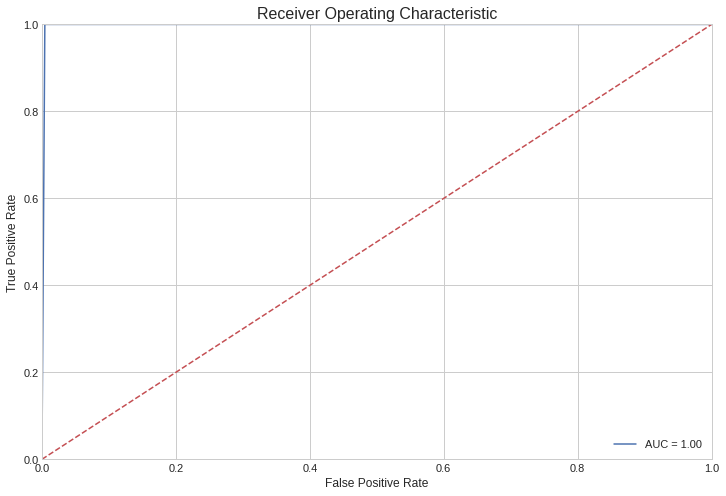

In [ ]:
# %% K-ello Neigbors

knn = KNeighborsClassifier(n_neighbors=5,p=1)

knn.fit(X_train,y_train)
y_pred = knn.predict(X_test)


print("Classification Report for K-Nearest Neighbours: \n", classification_report(y_test, y_pred))
print("Confusion Matrix of K-Nearest Neigbours: \n", confusion_matrix(y_test,y_pred))
plot_roc_auc_score(y_test, knn.predict_proba(X_test)[:,1])

###Random Forest Classifier

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:  1.0min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    3.2s finished


Classification Report for Random Forest Classifier: 
               precision    recall  f1-score   support

           0       0.99      0.96      0.97    176233
           1       0.96      0.99      0.97    176233

    accuracy                           0.97    352466
   macro avg       0.97      0.97      0.97    352466
weighted avg       0.97      0.97      0.97    352466

Confusion Matrix of Random Forest Classifier: 
 [[168749   7484]
 [  1561 174672]]


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    3.2s finished


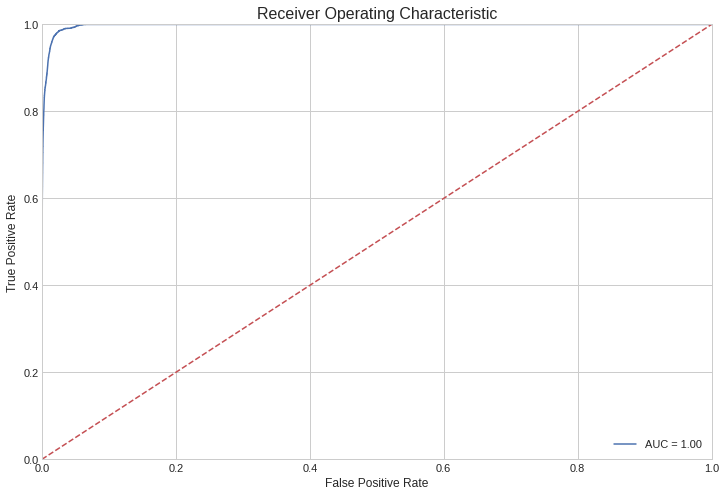

In [ ]:
# %% Random Forest Classifier

rf_clf = RandomForestClassifier(n_estimators=100,max_depth=8,random_state=42,
                                verbose=1,class_weight="balanced")

rf_clf.fit(X_train,y_train)
y_pred = rf_clf.predict(X_test)

print("Classification Report for Random Forest Classifier: \n", classification_report(y_test, y_pred))
print("Confusion Matrix of Random Forest Classifier: \n", confusion_matrix(y_test,y_pred))
plot_roc_auc_score(y_test, rf_clf.predict_proba(X_test)[:,1])

### K-Means Clustering

In [ ]:
dfBinaryCols = pd.get_dummies(df_reduced,columns = ["age","gender","merchant","category"])
dfBinaryCols = dfBinaryCols.drop(["customer"], axis = 1)

In [ ]:
dfBinaryCols

,step,amount,fraud,age_0,age_1,age_2,age_3,age_4,age_5,age_6,...,category_5,category_6,category_7,category_8,category_9,category_10,category_11,category_12,category_13,category_14
0,0,4.55,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,1,0,0
1,0,39.68,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
2,0,26.89,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,1,0,0
3,0,17.25,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,1,0,0
4,0,35.72,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
594638,179,20.53,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,1,0,0
594639,179,50.73,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,1,0,0
594640,179,22.44,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
594641,179,14.46,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,1,0,0


#### Standardized - K-Means Clustering

In [ ]:
scaler = StandardScaler()
dfElim = dfBinaryCols
dfElim = dfElim.drop(["step", "fraud"], axis = 1)
dfStandScaler = scaler.fit_transform(dfBinaryCols)
dfStand = pd.DataFrame(dfStandScaler)
dfStand.columns = list(dfBinaryCols)
dataStandardized = dfStand
dataStandardized["fraud"] = dfBinaryCols["fraud"]

k: 2  cost: 45589736.20961732
k: 3  cost: 44111841.251657225
k: 4  cost: 43258617.450582676
k: 5  cost: 42430385.20399943
k: 6  cost: 41319584.80538789
k: 7  cost: 40222561.746008396
k: 8  cost: 38881576.48564438
k: 9  cost: 37243785.558646485
k: 10  cost: 37043650.27243943


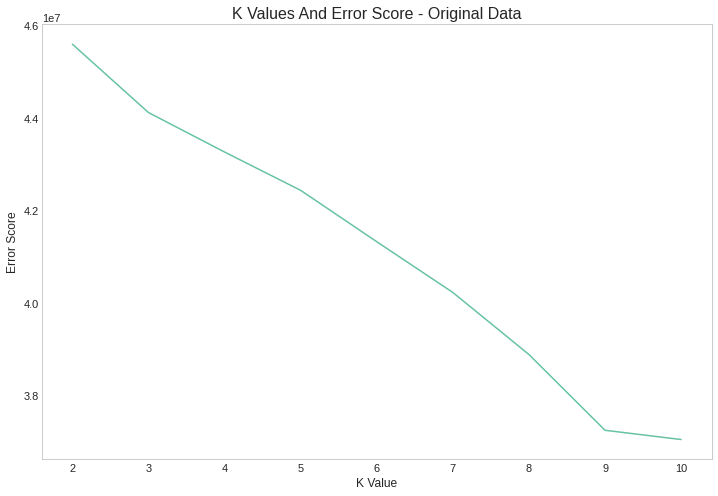

In [ ]:
error = list()
kList = list()
for k in range(2, 11):
    kmeans_model = KMeans(n_clusters = k, random_state = 891).fit(dataStandardized)
    labels = kmeans_model.labels_
    labels = labels.tolist()
    cost = kmeans_model.inertia_
    error.append(cost)
    kList.append(k)
    print("k:", k, " cost:", cost)
plt.plot(kList, error)
plt.title("K Values And Error Score - Original Data")
plt.xlabel("K Value")
plt.ylabel("Error Score")
plt.grid()
plt.show()

###Standardized - Using the Best Value of k

In [ ]:
kmeans = KMeans(n_clusters = 4, random_state = 891).fit(dataStandardized)
labs = kmeans.labels_
labsList = labs.tolist()
dataStandardized["customerGroup"] = labsList
dataStandardized["fraud"] = df_reduced["fraud"]

###Standardized - Examine Customer Group Distribution

Text(0.5, 1.0, 'Customer Group Breakdown - Original Data')

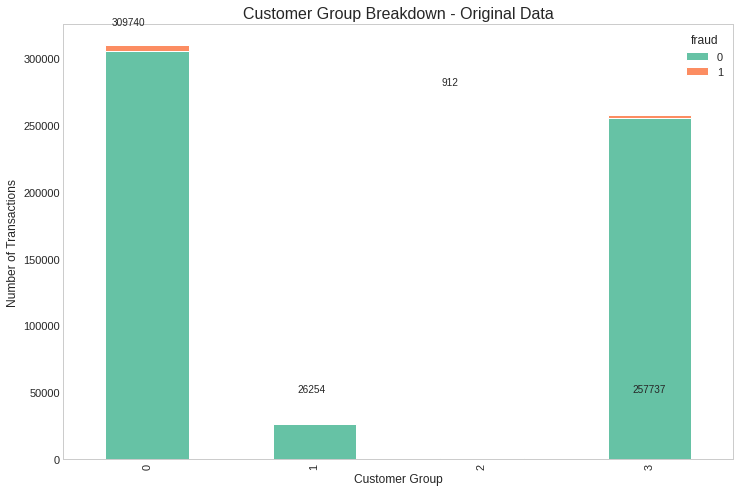

In [ ]:
counts = dataStandardized.groupby("customerGroup").count()
counts = counts["step"].values.tolist()

dataStandardized.groupby(['customerGroup', 'fraud']).size().unstack().plot(kind='bar', stacked=True)
annotate(counts[0], [-0.21, 325000])
annotate(counts[1], [0.9, 50000])
annotate(counts[2], [1.76, 280000])
annotate(counts[3], [2.9, 50000])

ylabel("Number of Transactions")
xlabel("Customer Group")
grid()
title("Customer Group Breakdown - Original Data")

###XGBoost

In [ ]:
def plot_pr_curve(precision, recall, avg_precision):
    plt.figure(figsize = (8, 6))
    plt.plot(recall, precision, label = f"Avg. PR: {round(avg_precision, 2)}")
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.ylim([0.5, 1.05])
    plt.xlim([0.55, 1.0])
    plt.title('Precision-Recall Curve')
    plt.legend()
    plt.show()

In [ ]:
#scale_pos_weight - sample Weights
num_pos_samples = y.value_counts().values[1]
num_neg_samples = y.value_counts().values[0]
num_neg_samples / num_pos_samples, np.sqrt(num_neg_samples / num_pos_samples)

(81.58930555555555, 9.0326798656631)

In [ ]:
from xgboost import XGBClassifier
import xgboost as xgb

xgb_params = {
         'objective': 'binary:logistic',
         'lambda': 0.0030282073258141168, 
         'alpha': 0.01563845128469084,
         'colsample_bytree': 0.55,
         'subsample': 0.7,
         'learning_rate': 0.01,
         'max_depth': 9,
         'random_state': 2020, 
         'min_child_weight': 257,
         'eval_metric': 'aucpr',
         'seed': 2021,
         'scale_pos_weight': np.sqrt(num_neg_samples / num_pos_samples) #np.sqrt()?
         }

In [ ]:
def plot_confusion(mat):
    plt.figure(figsize = (8, 4))
    sns.heatmap(pd.DataFrame(mat), annot = True, annot_kws = {"size": 25}, cmap = 'Blues', fmt = 'g')
    plt.title('Confusion matrix', y = 1.1, fontsize = 22)
    plt.ylabel('Actual', fontsize = 18)
    plt.xlabel('Predicted', fontsize = 18)
    plt.show()

Fold: 1
[0]	train-aucpr:0.704396	valid-aucpr:0.509234
Multiple eval metrics have been passed: 'valid-aucpr' will be used for early stopping.

Will train until valid-aucpr hasn't improved in 100 rounds.
[200]	train-aucpr:0.885259	valid-aucpr:0.806705
[400]	train-aucpr:0.899454	valid-aucpr:0.830816
[600]	train-aucpr:0.904551	valid-aucpr:0.837566
[800]	train-aucpr:0.909031	valid-aucpr:0.842738
[1000]	train-aucpr:0.911691	valid-aucpr:0.845292
[1200]	train-aucpr:0.913891	valid-aucpr:0.847678
[1400]	train-aucpr:0.91594	valid-aucpr:0.849337
[1600]	train-aucpr:0.917818	valid-aucpr:0.850919
[1800]	train-aucpr:0.919499	valid-aucpr:0.852293
[2000]	train-aucpr:0.921014	valid-aucpr:0.853361
[2200]	train-aucpr:0.922425	valid-aucpr:0.854294
[2400]	train-aucpr:0.9237	valid-aucpr:0.855556
[2600]	train-aucpr:0.924791	valid-aucpr:0.856215
[2800]	train-aucpr:0.925747	valid-aucpr:0.856728
[3000]	train-aucpr:0.926611	valid-aucpr:0.857423
[3200]	train-aucpr:0.927568	valid-aucpr:0.858436
[3400]	train-aucpr:0.

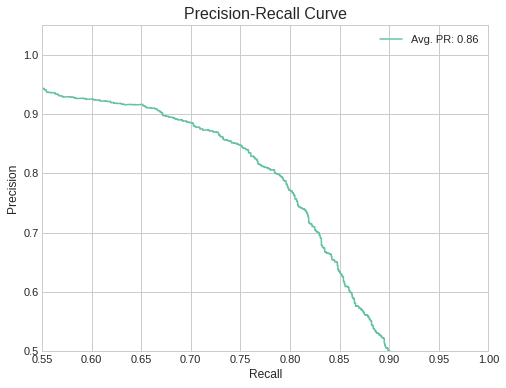

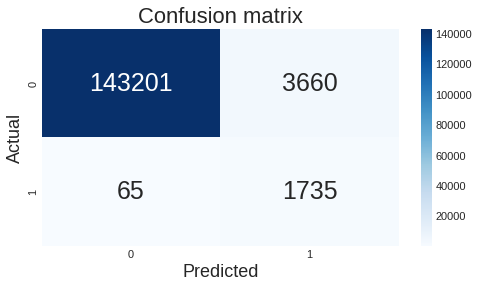

Classification Report: 
              precision    recall  f1-score   support

           0       1.00      0.98      0.99    146861
           1       0.32      0.96      0.48      1800

    accuracy                           0.97    148661
   macro avg       0.66      0.97      0.73    148661
weighted avg       0.99      0.97      0.98    148661


Fold: 2
[0]	train-aucpr:0.615218	valid-aucpr:0.614446
Multiple eval metrics have been passed: 'valid-aucpr' will be used for early stopping.

Will train until valid-aucpr hasn't improved in 100 rounds.
[200]	train-aucpr:0.867558	valid-aucpr:0.834814
[400]	train-aucpr:0.885655	valid-aucpr:0.853462
Stopping. Best iteration:
[430]	train-aucpr:0.887067	valid-aucpr:0.855214


Avg. Precision-Recall Score: 0.8517926144099643


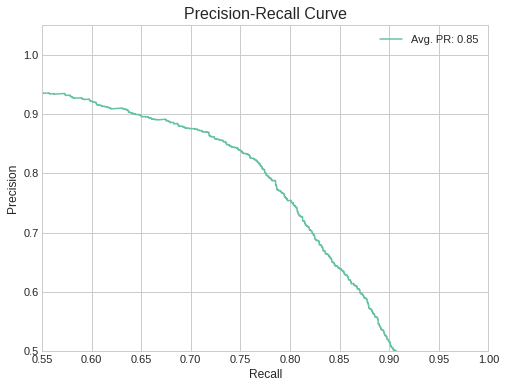

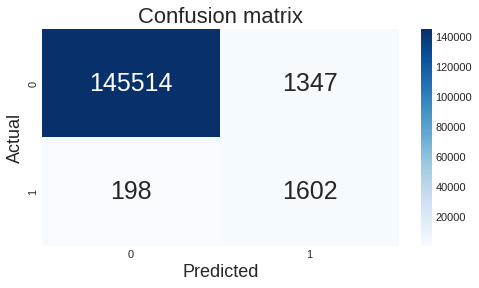

Classification Report: 
              precision    recall  f1-score   support

           0       1.00      0.99      0.99    146861
           1       0.54      0.89      0.67      1800

    accuracy                           0.99    148661
   macro avg       0.77      0.94      0.83    148661
weighted avg       0.99      0.99      0.99    148661


Fold: 3
[0]	train-aucpr:0.591569	valid-aucpr:0.622143
Multiple eval metrics have been passed: 'valid-aucpr' will be used for early stopping.

Will train until valid-aucpr hasn't improved in 100 rounds.
[200]	train-aucpr:0.86279	valid-aucpr:0.855887
[400]	train-aucpr:0.881024	valid-aucpr:0.870236
Stopping. Best iteration:
[432]	train-aucpr:0.882684	valid-aucpr:0.871813


Avg. Precision-Recall Score: 0.8708607379567097


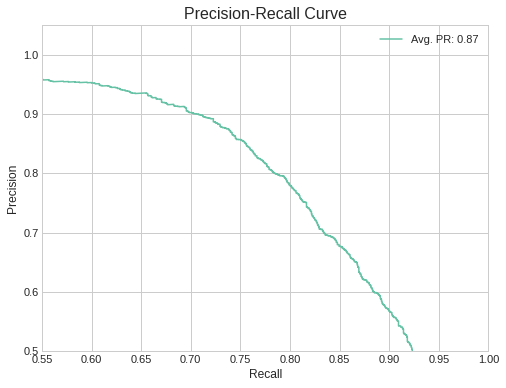

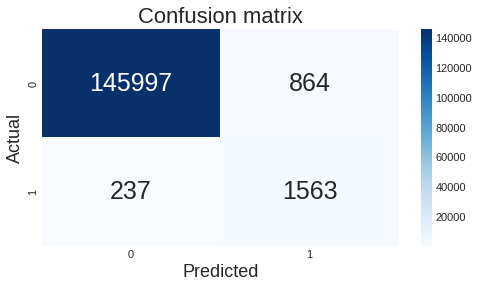

Classification Report: 
              precision    recall  f1-score   support

           0       1.00      0.99      1.00    146861
           1       0.64      0.87      0.74      1800

    accuracy                           0.99    148661
   macro avg       0.82      0.93      0.87    148661
weighted avg       0.99      0.99      0.99    148661


Fold: 4
[0]	train-aucpr:0.644696	valid-aucpr:0.731245
Multiple eval metrics have been passed: 'valid-aucpr' will be used for early stopping.

Will train until valid-aucpr hasn't improved in 100 rounds.
[200]	train-aucpr:0.847116	valid-aucpr:0.882327
[400]	train-aucpr:0.86968	valid-aucpr:0.898047
[600]	train-aucpr:0.878431	valid-aucpr:0.906698
[800]	train-aucpr:0.884099	valid-aucpr:0.911433
[1000]	train-aucpr:0.88946	valid-aucpr:0.914766
[1200]	train-aucpr:0.892592	valid-aucpr:0.916809
[1400]	train-aucpr:0.895944	valid-aucpr:0.919111
[1600]	train-aucpr:0.898406	valid-aucpr:0.920545
[1800]	train-aucpr:0.90066	valid-aucpr:0.921617
[2000]	train

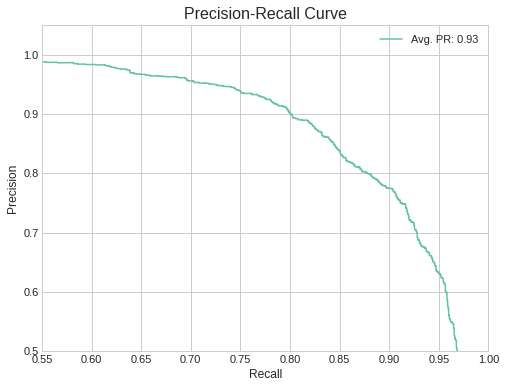

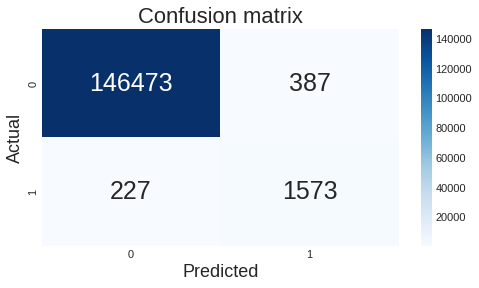

Classification Report: 
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    146860
           1       0.80      0.87      0.84      1800

    accuracy                           1.00    148660
   macro avg       0.90      0.94      0.92    148660
weighted avg       1.00      1.00      1.00    148660




In [ ]:
n_folds = 4
preds_xg = []

skf = StratifiedKFold(n_splits = n_folds)

for i, (trn_idx, val_idx) in enumerate(skf.split(X, y)):
    print(f"Fold: {i + 1}")
    Xtrain, ytrain = X.iloc[trn_idx], y[trn_idx]
    Xvalid, yvalid = X.iloc[val_idx], y[val_idx]
    
    xg_train = xgb.DMatrix(Xtrain, label = ytrain)
    xg_valid = xgb.DMatrix(Xvalid, label = yvalid)

    clf = xgb.train(xgb_params,
                              xg_train,
                              10000,
                              verbose_eval = 200,
                              evals = [(xg_train, 'train'), (xg_valid, 'valid')],
                              early_stopping_rounds = 100)

    valid_preds = clf.predict(xg_valid)
    
    avg_precision = average_precision_score(yvalid, valid_preds)
    print(f'\nAvg. Precision-Recall Score: {avg_precision}')
    
    precision, recall, _ = precision_recall_curve(yvalid, valid_preds)
    plot_pr_curve(precision, recall, avg_precision)
    
    conf_mat = confusion_matrix(yvalid, valid_preds > 0.5)
    plot_confusion(conf_mat)
    
    print(f"Classification Report: \n{classification_report(yvalid, valid_preds > 0.5, labels = [0, 1])}")
    
    preds_xg.append(valid_preds)
    print()

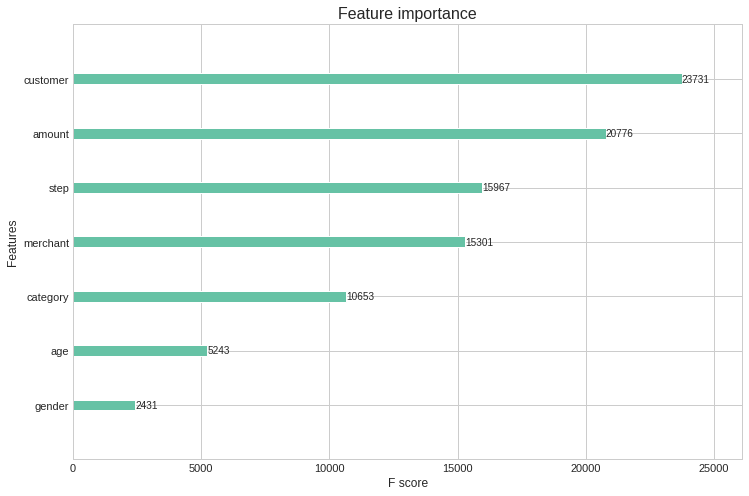

In [ ]:
xgb.plot_importance(clf)

In [ ]:
X = df.drop(['fraud', 'step'], axis = 1)
y = df['fraud'].copy()

scale_pos_weight is the ratio of number of negative class to the positive class.

In [ ]:
#scale_pos_weight - sample Weights
num_pos_samples = y.value_counts().values[1]
num_neg_samples = y.value_counts().values[0]
xgb_params['scale_pos_weight'] = np.sqrt(num_neg_samples / num_pos_samples) #set the new class weights

num_neg_samples / num_pos_samples, np.sqrt(num_neg_samples / num_pos_samples)

(81.58930555555555, 9.0326798656631)

This Xgboost model does a good job by keeping the False Negatives low (high Recall) which is preferred in Fraud/Spam/Churn detection setup.

When using 'scale_pos_weight' = sqrt(neg/pos), the precision has increased (lesser FP) but the recall has decresed a bit (higher FN) compared to using 'scale_pos_weight' = neg/pos.

###Naive Bayes

In [ ]:
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import cross_val_score
gnb = GaussianNB()
nb = cross_val_score(gnb, X_train, y_train, cv = 10)
print("Train Data:", numpy.mean(nb))

gnb = GaussianNB()
nb = cross_val_score(gnb, X_test, y_test, cv = 10)
print("Test Data:", numpy.mean(nb))

Train Data: 0.8912161669220107
Test Data: 0.8925484927559021


###Logistic Regression

In [ ]:
reg = sklearn.linear_model.LogisticRegression()
reg.fit(X_train, y_train)
print(reg.coef_)
y_pred = reg.predict(X_test)
confMat = sklearn.metrics.confusion_matrix(y_test, y_pred)
confMatList = confMat.tolist()
TN = confMatList[0][0]
TP = confMatList[1][1]
FN = confMatList[1][0]
FP = confMatList[0][1]

precision = (TP) / (TP + FP)
recall = (TP) / (TP + FN)
print("Precision:", precision)
print("Recall:", recall)
confMat

[[-2.27206878e-03 -5.11938908e-05 -1.05853551e-01 -7.71803939e-01
   2.94300948e-02 -1.63179517e-01  2.99777586e-02]]
Precision: 0.9434736547289975
Recall: 0.8792791361436281


/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



array([[166949,   9284],
       [ 21275, 154958]])

###Decision Tree - Different Max_Depth Values
Determine Best Max_Depth Value

In [ ]:
accuracy = []
for x in range(2, 101):
    print(x)
    clf = tree.DecisionTreeClassifier(max_depth = x)
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    confMat = sklearn.metrics.confusion_matrix(y_test, y_pred)
    confMatList = confMat.tolist()
    TN = confMatList[0][0]
    TP = confMatList[1][1]
    FN = confMatList[1][0]
    FP = confMatList[0][1]

    precision = (TP) / (TP + FP)
    recall = (TP) / (TP + FN)
    f1 = 2*((precision * recall) / (precision + recall))
    accuracy.append([x, precision, recall, f1])
    
accuracyDF = pd.DataFrame(data = accuracy, columns = ["k", "precision", "recall", "f-measure"])
accuracyDF = accuracyDF.sort_values(by = ["precision", "recall"], ascending = False)
accuracyDF

2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100


,k,precision,recall,f-measure
54,56,0.996365,1.000000,0.998179
71,73,0.996348,1.000000,0.998171
60,62,0.996342,1.000000,0.998168
62,64,0.996337,1.000000,0.998165
73,75,0.996331,1.000000,0.998162
...,...,...,...,...
4,6,0.957527,0.987959,0.972505
3,5,0.956378,0.980804,0.968437
2,4,0.948622,0.983238,0.965620
1,3,0.934790,0.986427,0.959915


###Apply Best Value

In [ ]:
maxVals = list(accuracyDF["k"])
best = maxVals[0]
clf = tree.DecisionTreeClassifier(max_depth = best)
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
accuracy.append([x, sklearn.metrics.accuracy_score(y_test, y_pred)])
dot_data = tree.export_graphviz(clf, out_file = None) 
graph = graphviz.Source(dot_data) 
graph.render("fraudDT")

#print("Accuracy:", sklearn.metrics.accuracy_score(y_test, y_pred))
confMat = sklearn.metrics.confusion_matrix(y_test, y_pred)
confMatList = confMat.tolist()
TN = confMatList[0][0]
TP = confMatList[1][1]
FN = confMatList[1][0]
FP = confMatList[0][1]

precision = (TP) / (TP + FP)
recall = (TP) / (TP + FN)
print("Precision:", precision)
print("Recall:", recall)
confMat

Precision: 0.9963421528720037
Recall: 1.0


array([[175586,    647],
       [     0, 176233]])

In [ ]:
graph